# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

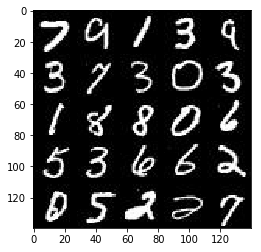

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

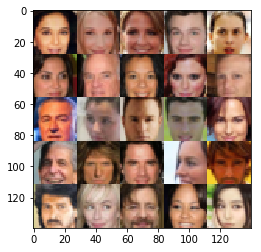

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='real_inputs')
    z_inputs = tf.placeholder(tf.float32, [None, z_dim], name='z_input')
    learning_rate = tf.placeholder(tf.float32, shape=(), name='learning_rate')
    
    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [7]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='SAME')
        relu1 = tf.maximum(alpha*x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='SAME')
        batch_norm2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha*batch_norm2, batch_norm2)

        x3 = tf.layers.conv2d(relu2, 256, 5, strides=1, padding='SAME')
        batch_norm3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha*batch_norm3, batch_norm3)
        
        x4 = tf.layers.conv2d(relu3, 512, 5, strides=1, padding='SAME')
        batch_norm4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha*batch_norm4, batch_norm4)

        # Now after the convolution layers we have to flatten the tensor and feed it into a fully-connected layer
        flattened_tensor = tf.reshape(relu4,(-1,7*7*512))
        logits = tf.layers.dense(flattened_tensor, 1)
        output = tf.sigmoid(logits) 
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train):
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.maximum(alpha*x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides=1, padding='SAME')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
    
        x3 = tf.layers.conv2d_transpose(x2, 128, 3, strides=1, padding='SAME')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)

        x4 = tf.layers.conv2d_transpose(x3, 64, 3, strides=2, padding='SAME')
        x4 = tf.layers.batch_normalization(x4, training=True)
        x4 = tf.maximum(alpha*x4, x4)

        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 3, strides=2, padding='SAME')
        output = tf.tanh(logits)
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    generator_model = generator(input_z, out_channel_dim, is_train=True , alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False , alpha=alpha )
    d_model_fake, d_logits_fake = discriminator(generator_model, reuse=True , alpha=alpha )
    
    generator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                        labels=tf.ones_like(d_model_fake)))
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                        labels=tf.ones_like(d_model_real)))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                        labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, generator_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    train_vars = tf.trainable_variables()
    generator_vars = [var for var in train_vars if var.name.startswith('generator')]
    discriminator_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    
    
    disc_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list=discriminator_vars)
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in update_ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        gen_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list=generator_vars)
    
    return disc_optimizer, gen_train_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], 
                                           data_shape[2],
                                           data_shape[3], 
                                           z_dim)
    disc_loss, gen_loss = model_loss(input_real, input_z, data_shape[3])
    disc_train_optimizer, gen_train_optimizer = model_opt(disc_loss, gen_loss, lr, beta1)
    batch_count = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images = batch_images*2
                batch_count += 1
                # Random noise for batch
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Running optimizers
                _ = sess.run(disc_train_optimizer, feed_dict={input_real:batch_images, input_z:batch_z, lr:learning_rate})
                _ = sess.run(gen_train_optimizer, feed_dict={input_z: batch_z, lr:learning_rate})
                

                # Evaluating results                
                if batch_count % 10 == 0:
                    train_loss_disc = disc_loss.eval({input_real: batch_images, input_z:batch_z, lr: learning_rate})
                    train_loss_gen = gen_loss.eval({input_z: batch_z, lr:learning_rate})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_disc),
                          "Generator Loss: {:.4f}".format(train_loss_gen))
                if batch_count % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
          
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.7434... Generator Loss: 0.2938
Epoch 1/2... Discriminator Loss: 4.5839... Generator Loss: 0.1210
Epoch 1/2... Discriminator Loss: 7.0936... Generator Loss: 0.3758
Epoch 1/2... Discriminator Loss: 6.0714... Generator Loss: 0.0444
Epoch 1/2... Discriminator Loss: 4.5120... Generator Loss: 0.2237
Epoch 1/2... Discriminator Loss: 13.6618... Generator Loss: 0.0001
Epoch 1/2... Discriminator Loss: 0.8958... Generator Loss: 5.0409
Epoch 1/2... Discriminator Loss: 0.7514... Generator Loss: 3.3258
Epoch 1/2... Discriminator Loss: 6.0366... Generator Loss: 0.0068
Epoch 1/2... Discriminator Loss: 2.4988... Generator Loss: 7.8996


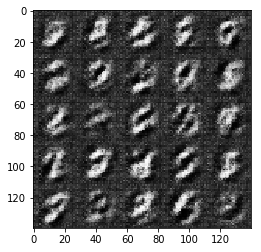

Epoch 1/2... Discriminator Loss: 1.6062... Generator Loss: 0.9969
Epoch 1/2... Discriminator Loss: 0.7052... Generator Loss: 6.3500
Epoch 1/2... Discriminator Loss: 0.8089... Generator Loss: 1.4463
Epoch 1/2... Discriminator Loss: 0.7754... Generator Loss: 1.1483
Epoch 1/2... Discriminator Loss: 0.5040... Generator Loss: 3.1301
Epoch 1/2... Discriminator Loss: 1.4474... Generator Loss: 1.1772
Epoch 1/2... Discriminator Loss: 1.8209... Generator Loss: 0.5560
Epoch 1/2... Discriminator Loss: 0.8444... Generator Loss: 1.9887
Epoch 1/2... Discriminator Loss: 0.5492... Generator Loss: 1.3831
Epoch 1/2... Discriminator Loss: 0.2018... Generator Loss: 2.4425


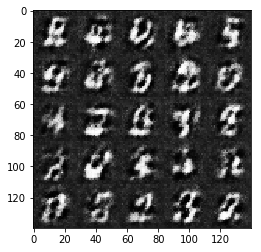

Epoch 1/2... Discriminator Loss: 0.2642... Generator Loss: 2.2635
Epoch 1/2... Discriminator Loss: 0.6211... Generator Loss: 3.2985
Epoch 1/2... Discriminator Loss: 0.9210... Generator Loss: 0.8435
Epoch 1/2... Discriminator Loss: 0.8306... Generator Loss: 1.1123
Epoch 1/2... Discriminator Loss: 0.2728... Generator Loss: 2.3879
Epoch 1/2... Discriminator Loss: 2.1868... Generator Loss: 7.6048
Epoch 1/2... Discriminator Loss: 2.2608... Generator Loss: 8.6250
Epoch 1/2... Discriminator Loss: 0.4538... Generator Loss: 1.8106
Epoch 1/2... Discriminator Loss: 1.0619... Generator Loss: 0.7511
Epoch 1/2... Discriminator Loss: 0.7242... Generator Loss: 1.0138


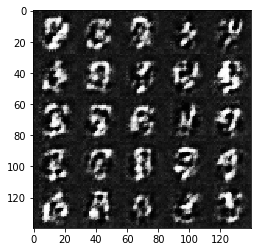

Epoch 1/2... Discriminator Loss: 0.2580... Generator Loss: 2.3569
Epoch 1/2... Discriminator Loss: 0.3187... Generator Loss: 2.8893
Epoch 1/2... Discriminator Loss: 0.8905... Generator Loss: 1.1490
Epoch 1/2... Discriminator Loss: 0.4119... Generator Loss: 4.6374
Epoch 1/2... Discriminator Loss: 2.0860... Generator Loss: 0.2443
Epoch 1/2... Discriminator Loss: 0.4441... Generator Loss: 1.9864
Epoch 1/2... Discriminator Loss: 0.6415... Generator Loss: 1.1936
Epoch 1/2... Discriminator Loss: 0.8438... Generator Loss: 1.8636
Epoch 1/2... Discriminator Loss: 2.4438... Generator Loss: 0.1824
Epoch 1/2... Discriminator Loss: 2.1363... Generator Loss: 0.3473


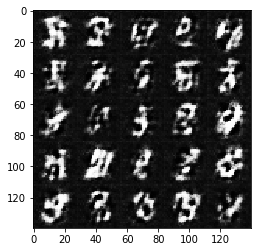

Epoch 1/2... Discriminator Loss: 2.3170... Generator Loss: 0.2467
Epoch 1/2... Discriminator Loss: 0.6677... Generator Loss: 1.2951
Epoch 1/2... Discriminator Loss: 0.6200... Generator Loss: 1.3112
Epoch 1/2... Discriminator Loss: 0.2423... Generator Loss: 2.2943
Epoch 1/2... Discriminator Loss: 0.2963... Generator Loss: 3.8152
Epoch 1/2... Discriminator Loss: 0.3953... Generator Loss: 1.7079
Epoch 1/2... Discriminator Loss: 0.4347... Generator Loss: 1.8538
Epoch 1/2... Discriminator Loss: 0.3238... Generator Loss: 2.0782
Epoch 1/2... Discriminator Loss: 0.2244... Generator Loss: 2.4669
Epoch 1/2... Discriminator Loss: 0.6155... Generator Loss: 2.3024


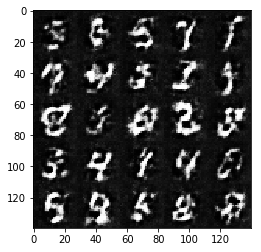

Epoch 1/2... Discriminator Loss: 0.3922... Generator Loss: 2.4496
Epoch 1/2... Discriminator Loss: 1.7433... Generator Loss: 0.5481
Epoch 1/2... Discriminator Loss: 1.1873... Generator Loss: 0.7267
Epoch 1/2... Discriminator Loss: 0.2510... Generator Loss: 2.4800
Epoch 1/2... Discriminator Loss: 0.3416... Generator Loss: 1.4572
Epoch 1/2... Discriminator Loss: 2.3530... Generator Loss: 0.3251
Epoch 1/2... Discriminator Loss: 0.1577... Generator Loss: 3.2999
Epoch 1/2... Discriminator Loss: 0.6862... Generator Loss: 3.6720
Epoch 1/2... Discriminator Loss: 1.0794... Generator Loss: 0.9412
Epoch 1/2... Discriminator Loss: 0.9134... Generator Loss: 0.6898


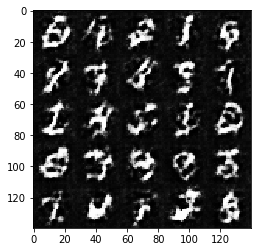

Epoch 1/2... Discriminator Loss: 0.3617... Generator Loss: 2.0260
Epoch 1/2... Discriminator Loss: 0.9942... Generator Loss: 8.0253
Epoch 1/2... Discriminator Loss: 0.7021... Generator Loss: 1.7995
Epoch 1/2... Discriminator Loss: 0.5404... Generator Loss: 1.5666
Epoch 1/2... Discriminator Loss: 0.4203... Generator Loss: 2.6841
Epoch 1/2... Discriminator Loss: 0.4917... Generator Loss: 1.4989
Epoch 1/2... Discriminator Loss: 0.2958... Generator Loss: 2.0448
Epoch 1/2... Discriminator Loss: 0.8168... Generator Loss: 1.1642
Epoch 1/2... Discriminator Loss: 0.5329... Generator Loss: 1.2233
Epoch 1/2... Discriminator Loss: 7.1833... Generator Loss: 13.8700


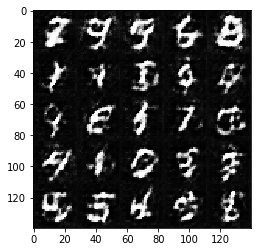

Epoch 1/2... Discriminator Loss: 3.0966... Generator Loss: 0.2285
Epoch 1/2... Discriminator Loss: 0.3143... Generator Loss: 2.4502
Epoch 1/2... Discriminator Loss: 0.9387... Generator Loss: 0.7057
Epoch 1/2... Discriminator Loss: 0.9212... Generator Loss: 0.7847
Epoch 1/2... Discriminator Loss: 0.9442... Generator Loss: 0.7241
Epoch 1/2... Discriminator Loss: 0.2904... Generator Loss: 2.2884
Epoch 1/2... Discriminator Loss: 0.6991... Generator Loss: 1.2622
Epoch 1/2... Discriminator Loss: 0.3102... Generator Loss: 2.3883
Epoch 1/2... Discriminator Loss: 1.1777... Generator Loss: 0.6186
Epoch 1/2... Discriminator Loss: 3.5189... Generator Loss: 0.0550


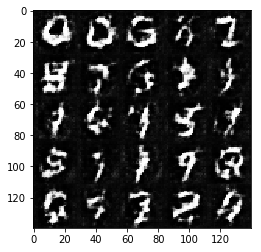

Epoch 1/2... Discriminator Loss: 0.6111... Generator Loss: 1.5696
Epoch 1/2... Discriminator Loss: 0.6157... Generator Loss: 1.9986
Epoch 1/2... Discriminator Loss: 0.3844... Generator Loss: 2.4113
Epoch 1/2... Discriminator Loss: 1.0071... Generator Loss: 1.1591
Epoch 1/2... Discriminator Loss: 1.0794... Generator Loss: 1.4149
Epoch 1/2... Discriminator Loss: 0.7914... Generator Loss: 0.9026
Epoch 1/2... Discriminator Loss: 0.9250... Generator Loss: 0.7050
Epoch 1/2... Discriminator Loss: 0.8242... Generator Loss: 0.7479
Epoch 1/2... Discriminator Loss: 0.7007... Generator Loss: 0.9469
Epoch 1/2... Discriminator Loss: 0.3716... Generator Loss: 1.4994


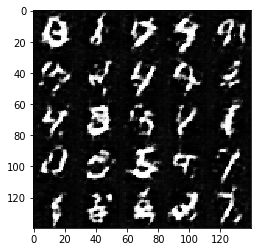

Epoch 1/2... Discriminator Loss: 0.6007... Generator Loss: 1.3462
Epoch 1/2... Discriminator Loss: 2.4063... Generator Loss: 0.1450
Epoch 1/2... Discriminator Loss: 2.1232... Generator Loss: 1.7959
Epoch 1/2... Discriminator Loss: 0.5657... Generator Loss: 1.8336
Epoch 1/2... Discriminator Loss: 0.9835... Generator Loss: 0.8479
Epoch 1/2... Discriminator Loss: 1.2776... Generator Loss: 7.1437
Epoch 1/2... Discriminator Loss: 0.9872... Generator Loss: 0.7538
Epoch 1/2... Discriminator Loss: 1.3464... Generator Loss: 0.6075
Epoch 1/2... Discriminator Loss: 0.4892... Generator Loss: 1.3704
Epoch 1/2... Discriminator Loss: 2.8205... Generator Loss: 0.1254


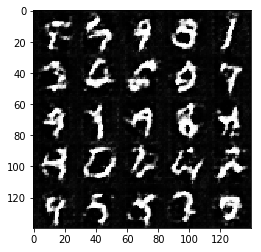

Epoch 1/2... Discriminator Loss: 0.2695... Generator Loss: 2.0123
Epoch 1/2... Discriminator Loss: 0.6789... Generator Loss: 1.0563
Epoch 1/2... Discriminator Loss: 0.7057... Generator Loss: 1.1427
Epoch 1/2... Discriminator Loss: 6.0730... Generator Loss: 8.5409
Epoch 1/2... Discriminator Loss: 2.2102... Generator Loss: 0.3456
Epoch 1/2... Discriminator Loss: 1.1690... Generator Loss: 0.6775
Epoch 1/2... Discriminator Loss: 0.5667... Generator Loss: 1.5932
Epoch 1/2... Discriminator Loss: 0.4092... Generator Loss: 2.1286
Epoch 1/2... Discriminator Loss: 0.9507... Generator Loss: 0.7276
Epoch 1/2... Discriminator Loss: 0.2315... Generator Loss: 2.1683


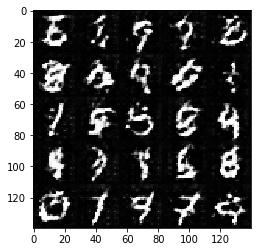

Epoch 1/2... Discriminator Loss: 2.3677... Generator Loss: 0.2338
Epoch 1/2... Discriminator Loss: 0.3251... Generator Loss: 2.1444
Epoch 1/2... Discriminator Loss: 0.9076... Generator Loss: 0.9517
Epoch 1/2... Discriminator Loss: 0.5848... Generator Loss: 1.1663
Epoch 1/2... Discriminator Loss: 0.3100... Generator Loss: 2.3207
Epoch 1/2... Discriminator Loss: 1.5731... Generator Loss: 0.5403
Epoch 1/2... Discriminator Loss: 0.5944... Generator Loss: 1.2303
Epoch 1/2... Discriminator Loss: 0.4468... Generator Loss: 1.4408
Epoch 1/2... Discriminator Loss: 0.4847... Generator Loss: 1.5451
Epoch 1/2... Discriminator Loss: 1.4758... Generator Loss: 0.4100


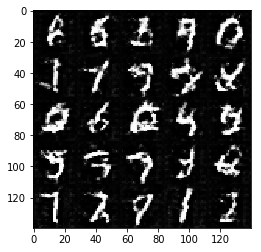

Epoch 1/2... Discriminator Loss: 0.7788... Generator Loss: 0.8450
Epoch 1/2... Discriminator Loss: 1.5205... Generator Loss: 0.3984
Epoch 1/2... Discriminator Loss: 1.4516... Generator Loss: 0.4624
Epoch 1/2... Discriminator Loss: 1.1573... Generator Loss: 0.5564
Epoch 1/2... Discriminator Loss: 1.0987... Generator Loss: 0.7043
Epoch 1/2... Discriminator Loss: 3.5014... Generator Loss: 0.0465
Epoch 1/2... Discriminator Loss: 0.9581... Generator Loss: 0.8783
Epoch 1/2... Discriminator Loss: 6.0106... Generator Loss: 0.0105
Epoch 1/2... Discriminator Loss: 1.3977... Generator Loss: 0.5921
Epoch 1/2... Discriminator Loss: 0.4960... Generator Loss: 1.8074


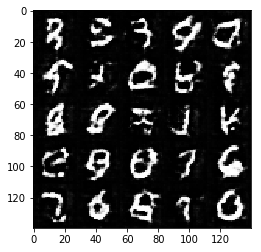

Epoch 1/2... Discriminator Loss: 0.3066... Generator Loss: 3.2237
Epoch 1/2... Discriminator Loss: 0.6914... Generator Loss: 2.0956
Epoch 1/2... Discriminator Loss: 2.4662... Generator Loss: 0.3035
Epoch 1/2... Discriminator Loss: 2.6980... Generator Loss: 0.2676
Epoch 1/2... Discriminator Loss: 0.9251... Generator Loss: 0.9069
Epoch 1/2... Discriminator Loss: 0.7040... Generator Loss: 1.0463
Epoch 1/2... Discriminator Loss: 1.6653... Generator Loss: 0.4448
Epoch 1/2... Discriminator Loss: 0.2916... Generator Loss: 1.9716
Epoch 1/2... Discriminator Loss: 1.3431... Generator Loss: 0.4409
Epoch 1/2... Discriminator Loss: 0.3073... Generator Loss: 1.8541


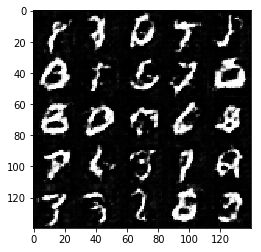

Epoch 1/2... Discriminator Loss: 2.1447... Generator Loss: 7.4461
Epoch 1/2... Discriminator Loss: 0.5037... Generator Loss: 1.6065
Epoch 1/2... Discriminator Loss: 1.3279... Generator Loss: 0.5794
Epoch 1/2... Discriminator Loss: 1.2912... Generator Loss: 0.7765
Epoch 1/2... Discriminator Loss: 1.4725... Generator Loss: 0.4194
Epoch 1/2... Discriminator Loss: 2.8908... Generator Loss: 0.1029
Epoch 1/2... Discriminator Loss: 0.6863... Generator Loss: 1.4157
Epoch 1/2... Discriminator Loss: 0.4490... Generator Loss: 1.5052
Epoch 1/2... Discriminator Loss: 1.5021... Generator Loss: 0.3841
Epoch 1/2... Discriminator Loss: 0.9177... Generator Loss: 0.9135


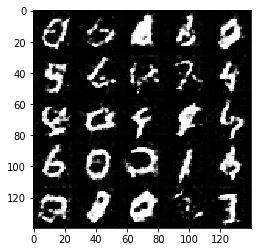

Epoch 1/2... Discriminator Loss: 0.8221... Generator Loss: 1.1152
Epoch 1/2... Discriminator Loss: 2.4447... Generator Loss: 0.1520
Epoch 1/2... Discriminator Loss: 4.7846... Generator Loss: 5.5362
Epoch 1/2... Discriminator Loss: 1.1323... Generator Loss: 0.6896
Epoch 1/2... Discriminator Loss: 1.7961... Generator Loss: 0.5840
Epoch 1/2... Discriminator Loss: 0.3762... Generator Loss: 1.8402
Epoch 1/2... Discriminator Loss: 0.3220... Generator Loss: 2.0310
Epoch 1/2... Discriminator Loss: 0.7573... Generator Loss: 0.8868
Epoch 1/2... Discriminator Loss: 1.0082... Generator Loss: 0.6532
Epoch 1/2... Discriminator Loss: 2.1589... Generator Loss: 0.2760


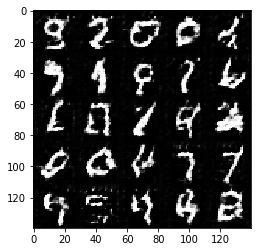

Epoch 1/2... Discriminator Loss: 0.8789... Generator Loss: 0.6867
Epoch 1/2... Discriminator Loss: 0.2987... Generator Loss: 4.4952
Epoch 1/2... Discriminator Loss: 2.3377... Generator Loss: 0.2730
Epoch 1/2... Discriminator Loss: 3.2868... Generator Loss: 0.1791
Epoch 1/2... Discriminator Loss: 1.5083... Generator Loss: 0.3958
Epoch 1/2... Discriminator Loss: 1.8952... Generator Loss: 0.2607
Epoch 1/2... Discriminator Loss: 2.1439... Generator Loss: 0.2607
Epoch 1/2... Discriminator Loss: 1.9971... Generator Loss: 0.2602
Epoch 1/2... Discriminator Loss: 2.1667... Generator Loss: 0.1842
Epoch 1/2... Discriminator Loss: 2.4068... Generator Loss: 0.1516


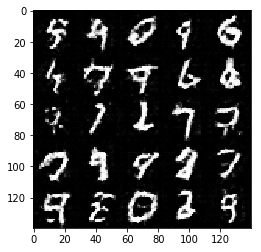

Epoch 1/2... Discriminator Loss: 1.5092... Generator Loss: 0.4841
Epoch 1/2... Discriminator Loss: 3.0380... Generator Loss: 0.0864
Epoch 1/2... Discriminator Loss: 0.9261... Generator Loss: 0.7917
Epoch 1/2... Discriminator Loss: 0.2604... Generator Loss: 2.5425
Epoch 1/2... Discriminator Loss: 0.4452... Generator Loss: 1.6333
Epoch 1/2... Discriminator Loss: 1.0388... Generator Loss: 0.8274
Epoch 1/2... Discriminator Loss: 1.0870... Generator Loss: 0.6587
Epoch 1/2... Discriminator Loss: 1.0690... Generator Loss: 0.5412
Epoch 1/2... Discriminator Loss: 1.5616... Generator Loss: 0.3752
Epoch 1/2... Discriminator Loss: 1.0317... Generator Loss: 0.8979


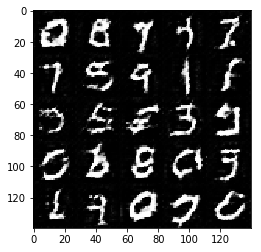

Epoch 1/2... Discriminator Loss: 0.8636... Generator Loss: 0.8287
Epoch 1/2... Discriminator Loss: 0.6257... Generator Loss: 2.6658
Epoch 1/2... Discriminator Loss: 3.0751... Generator Loss: 0.0900
Epoch 1/2... Discriminator Loss: 1.0732... Generator Loss: 3.0204
Epoch 1/2... Discriminator Loss: 1.4442... Generator Loss: 0.5757
Epoch 1/2... Discriminator Loss: 0.8228... Generator Loss: 0.8370
Epoch 1/2... Discriminator Loss: 1.2799... Generator Loss: 0.8823
Epoch 1/2... Discriminator Loss: 1.3307... Generator Loss: 0.5247
Epoch 1/2... Discriminator Loss: 0.4120... Generator Loss: 4.0669
Epoch 1/2... Discriminator Loss: 3.2915... Generator Loss: 0.0724


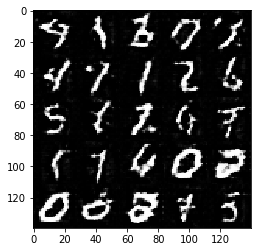

Epoch 1/2... Discriminator Loss: 2.9845... Generator Loss: 0.0774
Epoch 1/2... Discriminator Loss: 1.0326... Generator Loss: 0.8418
Epoch 1/2... Discriminator Loss: 1.0451... Generator Loss: 0.7084
Epoch 1/2... Discriminator Loss: 0.5732... Generator Loss: 1.2458
Epoch 1/2... Discriminator Loss: 0.3434... Generator Loss: 1.8041
Epoch 1/2... Discriminator Loss: 1.3138... Generator Loss: 0.4819
Epoch 1/2... Discriminator Loss: 1.7805... Generator Loss: 0.3412
Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 0.7057
Epoch 1/2... Discriminator Loss: 1.1388... Generator Loss: 0.5587
Epoch 1/2... Discriminator Loss: 2.4748... Generator Loss: 0.1309


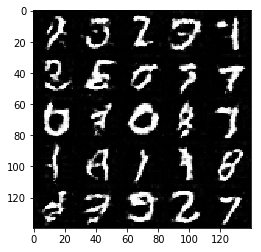

Epoch 1/2... Discriminator Loss: 1.3549... Generator Loss: 0.5728
Epoch 1/2... Discriminator Loss: 0.8019... Generator Loss: 0.9399
Epoch 1/2... Discriminator Loss: 2.9247... Generator Loss: 0.0804
Epoch 1/2... Discriminator Loss: 1.6540... Generator Loss: 0.3570
Epoch 1/2... Discriminator Loss: 1.7831... Generator Loss: 0.2942
Epoch 1/2... Discriminator Loss: 0.9210... Generator Loss: 0.6609
Epoch 1/2... Discriminator Loss: 2.4772... Generator Loss: 0.1566
Epoch 1/2... Discriminator Loss: 0.9115... Generator Loss: 0.6947
Epoch 1/2... Discriminator Loss: 2.1131... Generator Loss: 7.1390
Epoch 1/2... Discriminator Loss: 2.0738... Generator Loss: 0.8128


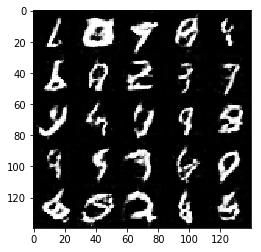

Epoch 1/2... Discriminator Loss: 1.6711... Generator Loss: 0.6134
Epoch 1/2... Discriminator Loss: 1.0753... Generator Loss: 0.8395
Epoch 1/2... Discriminator Loss: 0.5010... Generator Loss: 1.4482
Epoch 1/2... Discriminator Loss: 1.3780... Generator Loss: 0.6867
Epoch 1/2... Discriminator Loss: 2.6952... Generator Loss: 0.1222
Epoch 1/2... Discriminator Loss: 2.2735... Generator Loss: 0.1930
Epoch 1/2... Discriminator Loss: 1.5475... Generator Loss: 0.5140
Epoch 1/2... Discriminator Loss: 0.5895... Generator Loss: 3.0431
Epoch 1/2... Discriminator Loss: 0.7721... Generator Loss: 1.5564
Epoch 1/2... Discriminator Loss: 0.6520... Generator Loss: 1.0090


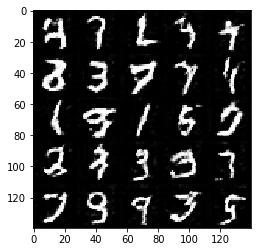

Epoch 1/2... Discriminator Loss: 1.1676... Generator Loss: 0.7009
Epoch 1/2... Discriminator Loss: 1.0668... Generator Loss: 0.6788
Epoch 1/2... Discriminator Loss: 0.8560... Generator Loss: 0.9910
Epoch 1/2... Discriminator Loss: 0.3768... Generator Loss: 1.9885
Epoch 1/2... Discriminator Loss: 0.5746... Generator Loss: 2.0179
Epoch 1/2... Discriminator Loss: 1.1635... Generator Loss: 2.6407
Epoch 1/2... Discriminator Loss: 0.9194... Generator Loss: 1.1979
Epoch 1/2... Discriminator Loss: 1.5313... Generator Loss: 0.4739
Epoch 1/2... Discriminator Loss: 0.4891... Generator Loss: 1.8602
Epoch 1/2... Discriminator Loss: 2.0692... Generator Loss: 0.2901


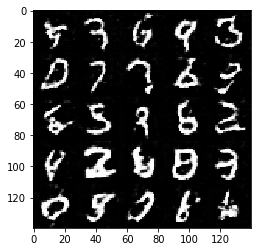

Epoch 1/2... Discriminator Loss: 1.7096... Generator Loss: 0.2824
Epoch 1/2... Discriminator Loss: 2.0210... Generator Loss: 0.2863
Epoch 1/2... Discriminator Loss: 0.8138... Generator Loss: 0.9555
Epoch 1/2... Discriminator Loss: 1.8257... Generator Loss: 0.2451
Epoch 1/2... Discriminator Loss: 1.6465... Generator Loss: 0.3446
Epoch 1/2... Discriminator Loss: 0.5831... Generator Loss: 2.1584
Epoch 1/2... Discriminator Loss: 0.4666... Generator Loss: 2.1910
Epoch 1/2... Discriminator Loss: 0.7159... Generator Loss: 1.1455
Epoch 1/2... Discriminator Loss: 0.8386... Generator Loss: 0.8671
Epoch 1/2... Discriminator Loss: 1.1613... Generator Loss: 0.6927


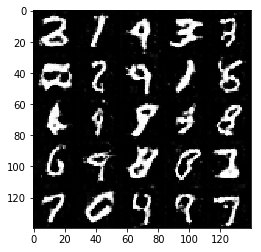

Epoch 1/2... Discriminator Loss: 1.9183... Generator Loss: 0.2993
Epoch 1/2... Discriminator Loss: 0.3301... Generator Loss: 2.2221
Epoch 1/2... Discriminator Loss: 0.7351... Generator Loss: 1.1720
Epoch 1/2... Discriminator Loss: 0.6476... Generator Loss: 1.1475
Epoch 1/2... Discriminator Loss: 3.0140... Generator Loss: 0.0789
Epoch 1/2... Discriminator Loss: 4.0196... Generator Loss: 0.0250
Epoch 1/2... Discriminator Loss: 1.1233... Generator Loss: 3.3331
Epoch 1/2... Discriminator Loss: 1.0564... Generator Loss: 0.7513
Epoch 1/2... Discriminator Loss: 0.7527... Generator Loss: 1.6500
Epoch 1/2... Discriminator Loss: 1.7436... Generator Loss: 0.6400


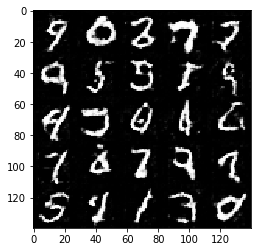

Epoch 1/2... Discriminator Loss: 0.2163... Generator Loss: 3.1478
Epoch 1/2... Discriminator Loss: 2.7352... Generator Loss: 0.1134
Epoch 1/2... Discriminator Loss: 0.1237... Generator Loss: 3.2413
Epoch 1/2... Discriminator Loss: 1.6205... Generator Loss: 0.4094
Epoch 1/2... Discriminator Loss: 0.5965... Generator Loss: 1.2838
Epoch 1/2... Discriminator Loss: 2.3605... Generator Loss: 0.2592
Epoch 1/2... Discriminator Loss: 1.7471... Generator Loss: 0.4474
Epoch 1/2... Discriminator Loss: 1.0805... Generator Loss: 0.9478
Epoch 1/2... Discriminator Loss: 0.9840... Generator Loss: 0.9542
Epoch 1/2... Discriminator Loss: 3.3279... Generator Loss: 0.1514


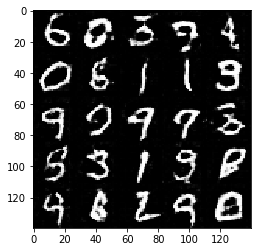

Epoch 1/2... Discriminator Loss: 0.8940... Generator Loss: 3.5703
Epoch 1/2... Discriminator Loss: 1.3908... Generator Loss: 0.5082
Epoch 1/2... Discriminator Loss: 0.3261... Generator Loss: 2.1169
Epoch 1/2... Discriminator Loss: 4.1144... Generator Loss: 8.3699
Epoch 1/2... Discriminator Loss: 0.4836... Generator Loss: 1.8925
Epoch 1/2... Discriminator Loss: 0.8884... Generator Loss: 0.8172
Epoch 1/2... Discriminator Loss: 0.4907... Generator Loss: 3.7532
Epoch 1/2... Discriminator Loss: 1.6861... Generator Loss: 0.4839
Epoch 1/2... Discriminator Loss: 1.0711... Generator Loss: 1.0044
Epoch 1/2... Discriminator Loss: 1.3036... Generator Loss: 4.8423


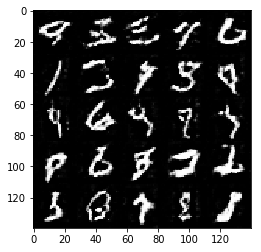

Epoch 1/2... Discriminator Loss: 0.6502... Generator Loss: 1.9650
Epoch 1/2... Discriminator Loss: 2.0420... Generator Loss: 0.2347
Epoch 1/2... Discriminator Loss: 1.5974... Generator Loss: 0.5602
Epoch 1/2... Discriminator Loss: 0.9742... Generator Loss: 0.7603
Epoch 1/2... Discriminator Loss: 1.5280... Generator Loss: 0.3469
Epoch 1/2... Discriminator Loss: 0.5188... Generator Loss: 1.3281
Epoch 1/2... Discriminator Loss: 0.8609... Generator Loss: 0.7278
Epoch 1/2... Discriminator Loss: 2.0864... Generator Loss: 0.2478
Epoch 1/2... Discriminator Loss: 1.0373... Generator Loss: 0.6412
Epoch 1/2... Discriminator Loss: 1.2744... Generator Loss: 0.6610


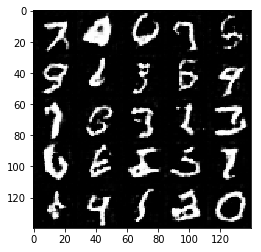

Epoch 1/2... Discriminator Loss: 0.6352... Generator Loss: 0.9770
Epoch 1/2... Discriminator Loss: 0.5504... Generator Loss: 1.4853
Epoch 1/2... Discriminator Loss: 1.7294... Generator Loss: 0.3357
Epoch 1/2... Discriminator Loss: 1.2876... Generator Loss: 0.5648
Epoch 1/2... Discriminator Loss: 3.3315... Generator Loss: 0.0749
Epoch 1/2... Discriminator Loss: 0.7190... Generator Loss: 1.0442
Epoch 1/2... Discriminator Loss: 1.0648... Generator Loss: 0.7250
Epoch 1/2... Discriminator Loss: 0.5718... Generator Loss: 1.5272
Epoch 1/2... Discriminator Loss: 0.7542... Generator Loss: 1.1613
Epoch 1/2... Discriminator Loss: 1.6933... Generator Loss: 0.3079


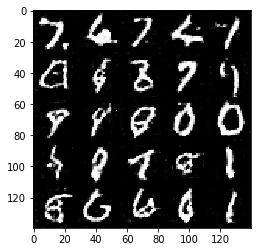

Epoch 1/2... Discriminator Loss: 1.2138... Generator Loss: 0.5085
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.5917
Epoch 1/2... Discriminator Loss: 1.9873... Generator Loss: 0.4208
Epoch 1/2... Discriminator Loss: 0.3227... Generator Loss: 2.4278
Epoch 1/2... Discriminator Loss: 0.6729... Generator Loss: 2.1820
Epoch 1/2... Discriminator Loss: 0.8487... Generator Loss: 3.4909
Epoch 1/2... Discriminator Loss: 0.3910... Generator Loss: 3.9013
Epoch 1/2... Discriminator Loss: 0.9640... Generator Loss: 0.7254
Epoch 1/2... Discriminator Loss: 0.7133... Generator Loss: 3.3538
Epoch 1/2... Discriminator Loss: 0.9951... Generator Loss: 0.9171


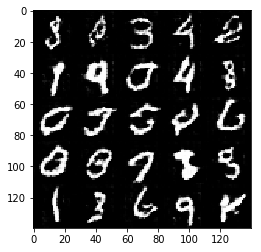

Epoch 2/2... Discriminator Loss: 0.2926... Generator Loss: 2.2676
Epoch 2/2... Discriminator Loss: 0.5723... Generator Loss: 4.9518
Epoch 2/2... Discriminator Loss: 0.4771... Generator Loss: 1.7522
Epoch 2/2... Discriminator Loss: 1.2476... Generator Loss: 0.4845
Epoch 2/2... Discriminator Loss: 1.3684... Generator Loss: 0.7590
Epoch 2/2... Discriminator Loss: 0.6816... Generator Loss: 3.8034
Epoch 2/2... Discriminator Loss: 0.5424... Generator Loss: 2.8268
Epoch 2/2... Discriminator Loss: 2.4378... Generator Loss: 0.1909
Epoch 2/2... Discriminator Loss: 1.5439... Generator Loss: 0.4490
Epoch 2/2... Discriminator Loss: 0.4719... Generator Loss: 1.7770


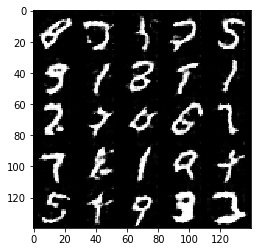

Epoch 2/2... Discriminator Loss: 0.4604... Generator Loss: 1.9622
Epoch 2/2... Discriminator Loss: 1.3786... Generator Loss: 0.6367
Epoch 2/2... Discriminator Loss: 0.4207... Generator Loss: 2.9291
Epoch 2/2... Discriminator Loss: 1.0392... Generator Loss: 0.8271
Epoch 2/2... Discriminator Loss: 1.5657... Generator Loss: 0.3847
Epoch 2/2... Discriminator Loss: 3.4931... Generator Loss: 0.0454
Epoch 2/2... Discriminator Loss: 0.6639... Generator Loss: 1.2772
Epoch 2/2... Discriminator Loss: 2.1045... Generator Loss: 0.2450
Epoch 2/2... Discriminator Loss: 2.8448... Generator Loss: 0.2640
Epoch 2/2... Discriminator Loss: 1.7848... Generator Loss: 0.3951


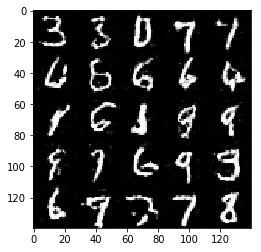

Epoch 2/2... Discriminator Loss: 2.0636... Generator Loss: 0.3739
Epoch 2/2... Discriminator Loss: 1.3860... Generator Loss: 0.4979
Epoch 2/2... Discriminator Loss: 1.1473... Generator Loss: 0.6754
Epoch 2/2... Discriminator Loss: 0.4324... Generator Loss: 1.7771
Epoch 2/2... Discriminator Loss: 1.4706... Generator Loss: 0.4504
Epoch 2/2... Discriminator Loss: 0.4173... Generator Loss: 2.5900
Epoch 2/2... Discriminator Loss: 0.9784... Generator Loss: 0.7156
Epoch 2/2... Discriminator Loss: 2.8309... Generator Loss: 0.1756
Epoch 2/2... Discriminator Loss: 0.6022... Generator Loss: 1.5582
Epoch 2/2... Discriminator Loss: 4.3044... Generator Loss: 0.0230


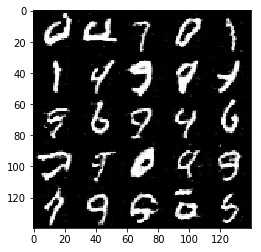

Epoch 2/2... Discriminator Loss: 0.6643... Generator Loss: 2.0103
Epoch 2/2... Discriminator Loss: 0.6515... Generator Loss: 1.2072
Epoch 2/2... Discriminator Loss: 0.8533... Generator Loss: 0.8546
Epoch 2/2... Discriminator Loss: 1.5793... Generator Loss: 0.4427
Epoch 2/2... Discriminator Loss: 0.5608... Generator Loss: 2.9162
Epoch 2/2... Discriminator Loss: 0.7157... Generator Loss: 2.6762
Epoch 2/2... Discriminator Loss: 2.8277... Generator Loss: 0.1342
Epoch 2/2... Discriminator Loss: 2.4790... Generator Loss: 0.2256
Epoch 2/2... Discriminator Loss: 1.1606... Generator Loss: 0.6737
Epoch 2/2... Discriminator Loss: 1.2739... Generator Loss: 0.5892


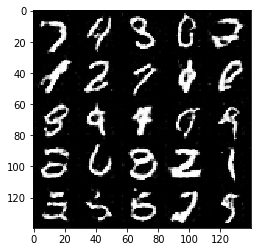

Epoch 2/2... Discriminator Loss: 0.5004... Generator Loss: 1.5935
Epoch 2/2... Discriminator Loss: 1.0355... Generator Loss: 0.6495
Epoch 2/2... Discriminator Loss: 1.1181... Generator Loss: 0.6161
Epoch 2/2... Discriminator Loss: 1.4097... Generator Loss: 0.4477
Epoch 2/2... Discriminator Loss: 2.1006... Generator Loss: 0.3111
Epoch 2/2... Discriminator Loss: 0.4086... Generator Loss: 1.7279
Epoch 2/2... Discriminator Loss: 0.2012... Generator Loss: 4.6781
Epoch 2/2... Discriminator Loss: 1.2114... Generator Loss: 0.6372
Epoch 2/2... Discriminator Loss: 3.8535... Generator Loss: 0.0415
Epoch 2/2... Discriminator Loss: 1.2913... Generator Loss: 1.9956


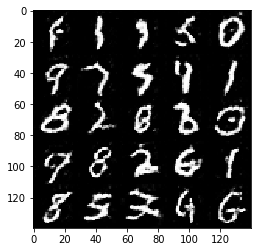

Epoch 2/2... Discriminator Loss: 2.3582... Generator Loss: 0.2586
Epoch 2/2... Discriminator Loss: 0.4618... Generator Loss: 1.3841
Epoch 2/2... Discriminator Loss: 1.0793... Generator Loss: 0.5796
Epoch 2/2... Discriminator Loss: 2.2747... Generator Loss: 0.2173
Epoch 2/2... Discriminator Loss: 1.9867... Generator Loss: 0.2564
Epoch 2/2... Discriminator Loss: 1.0896... Generator Loss: 0.6651
Epoch 2/2... Discriminator Loss: 3.2474... Generator Loss: 0.0703
Epoch 2/2... Discriminator Loss: 0.4218... Generator Loss: 3.6526
Epoch 2/2... Discriminator Loss: 0.9901... Generator Loss: 0.7188
Epoch 2/2... Discriminator Loss: 0.3992... Generator Loss: 1.6463


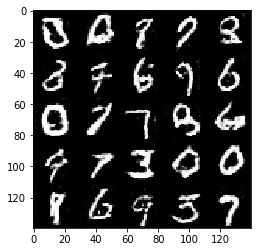

Epoch 2/2... Discriminator Loss: 0.5441... Generator Loss: 1.5312
Epoch 2/2... Discriminator Loss: 0.6619... Generator Loss: 1.2024
Epoch 2/2... Discriminator Loss: 0.6641... Generator Loss: 1.4926
Epoch 2/2... Discriminator Loss: 1.7002... Generator Loss: 0.2692
Epoch 2/2... Discriminator Loss: 1.1532... Generator Loss: 3.9822
Epoch 2/2... Discriminator Loss: 3.1341... Generator Loss: 5.3175
Epoch 2/2... Discriminator Loss: 0.9282... Generator Loss: 1.0013
Epoch 2/2... Discriminator Loss: 0.6886... Generator Loss: 1.3270
Epoch 2/2... Discriminator Loss: 0.6031... Generator Loss: 1.4656
Epoch 2/2... Discriminator Loss: 0.8303... Generator Loss: 0.7238


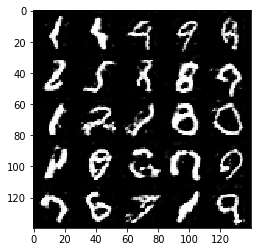

Epoch 2/2... Discriminator Loss: 1.2329... Generator Loss: 0.4703
Epoch 2/2... Discriminator Loss: 0.6170... Generator Loss: 1.5186
Epoch 2/2... Discriminator Loss: 0.3647... Generator Loss: 1.8579
Epoch 2/2... Discriminator Loss: 1.6452... Generator Loss: 0.4179
Epoch 2/2... Discriminator Loss: 0.9947... Generator Loss: 8.7088
Epoch 2/2... Discriminator Loss: 2.8272... Generator Loss: 0.1289
Epoch 2/2... Discriminator Loss: 0.6342... Generator Loss: 1.5058
Epoch 2/2... Discriminator Loss: 0.6721... Generator Loss: 1.2071
Epoch 2/2... Discriminator Loss: 3.2448... Generator Loss: 0.1729
Epoch 2/2... Discriminator Loss: 1.0847... Generator Loss: 0.8096


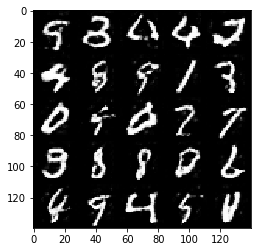

Epoch 2/2... Discriminator Loss: 1.4960... Generator Loss: 0.3647
Epoch 2/2... Discriminator Loss: 1.1749... Generator Loss: 5.0629
Epoch 2/2... Discriminator Loss: 1.9344... Generator Loss: 0.2619
Epoch 2/2... Discriminator Loss: 1.5629... Generator Loss: 0.4210
Epoch 2/2... Discriminator Loss: 0.6728... Generator Loss: 1.0117
Epoch 2/2... Discriminator Loss: 3.6662... Generator Loss: 0.0846
Epoch 2/2... Discriminator Loss: 2.3233... Generator Loss: 0.2151
Epoch 2/2... Discriminator Loss: 0.6003... Generator Loss: 1.3224
Epoch 2/2... Discriminator Loss: 2.2267... Generator Loss: 0.1518
Epoch 2/2... Discriminator Loss: 0.8854... Generator Loss: 1.6330


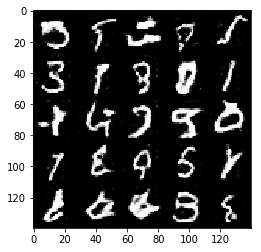

Epoch 2/2... Discriminator Loss: 0.4325... Generator Loss: 2.8801
Epoch 2/2... Discriminator Loss: 0.8098... Generator Loss: 1.1032
Epoch 2/2... Discriminator Loss: 1.3706... Generator Loss: 0.4739
Epoch 2/2... Discriminator Loss: 1.7688... Generator Loss: 0.6731
Epoch 2/2... Discriminator Loss: 0.6929... Generator Loss: 5.0382
Epoch 2/2... Discriminator Loss: 0.2909... Generator Loss: 4.1402
Epoch 2/2... Discriminator Loss: 0.6951... Generator Loss: 1.2516
Epoch 2/2... Discriminator Loss: 1.2468... Generator Loss: 0.5974
Epoch 2/2... Discriminator Loss: 1.1500... Generator Loss: 0.6925
Epoch 2/2... Discriminator Loss: 1.2986... Generator Loss: 0.5204


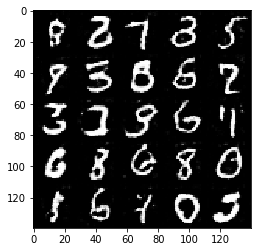

Epoch 2/2... Discriminator Loss: 0.4929... Generator Loss: 1.5389
Epoch 2/2... Discriminator Loss: 0.7171... Generator Loss: 1.0235
Epoch 2/2... Discriminator Loss: 0.6109... Generator Loss: 5.7133
Epoch 2/2... Discriminator Loss: 0.6091... Generator Loss: 1.7892
Epoch 2/2... Discriminator Loss: 3.0750... Generator Loss: 0.1337
Epoch 2/2... Discriminator Loss: 0.3258... Generator Loss: 1.9783
Epoch 2/2... Discriminator Loss: 0.4077... Generator Loss: 2.6625
Epoch 2/2... Discriminator Loss: 1.5026... Generator Loss: 0.9915
Epoch 2/2... Discriminator Loss: 0.9412... Generator Loss: 1.1716
Epoch 2/2... Discriminator Loss: 0.6300... Generator Loss: 1.2067


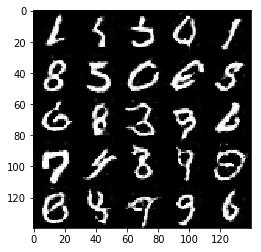

Epoch 2/2... Discriminator Loss: 0.5763... Generator Loss: 1.6697
Epoch 2/2... Discriminator Loss: 0.4140... Generator Loss: 1.5216
Epoch 2/2... Discriminator Loss: 0.4179... Generator Loss: 2.7736
Epoch 2/2... Discriminator Loss: 0.3537... Generator Loss: 3.3972
Epoch 2/2... Discriminator Loss: 0.2270... Generator Loss: 2.3911
Epoch 2/2... Discriminator Loss: 0.8837... Generator Loss: 1.3684
Epoch 2/2... Discriminator Loss: 1.3276... Generator Loss: 0.6391
Epoch 2/2... Discriminator Loss: 0.6278... Generator Loss: 0.9778
Epoch 2/2... Discriminator Loss: 0.6383... Generator Loss: 1.0428
Epoch 2/2... Discriminator Loss: 1.4912... Generator Loss: 0.3493


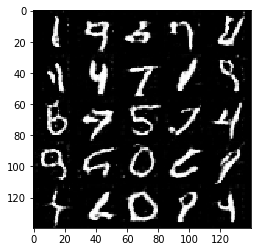

Epoch 2/2... Discriminator Loss: 1.1988... Generator Loss: 0.5650
Epoch 2/2... Discriminator Loss: 0.3681... Generator Loss: 1.5495
Epoch 2/2... Discriminator Loss: 1.2024... Generator Loss: 0.5885
Epoch 2/2... Discriminator Loss: 0.8740... Generator Loss: 0.9695
Epoch 2/2... Discriminator Loss: 0.6009... Generator Loss: 1.0935
Epoch 2/2... Discriminator Loss: 3.2786... Generator Loss: 0.0642
Epoch 2/2... Discriminator Loss: 2.7671... Generator Loss: 0.1713
Epoch 2/2... Discriminator Loss: 0.9107... Generator Loss: 1.0423
Epoch 2/2... Discriminator Loss: 0.7446... Generator Loss: 0.9228
Epoch 2/2... Discriminator Loss: 0.8292... Generator Loss: 6.1525


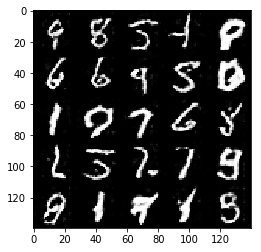

Epoch 2/2... Discriminator Loss: 0.5709... Generator Loss: 1.5351
Epoch 2/2... Discriminator Loss: 0.1703... Generator Loss: 3.1026
Epoch 2/2... Discriminator Loss: 3.1239... Generator Loss: 0.0597
Epoch 2/2... Discriminator Loss: 0.5426... Generator Loss: 1.3662
Epoch 2/2... Discriminator Loss: 2.4219... Generator Loss: 0.5133
Epoch 2/2... Discriminator Loss: 0.6863... Generator Loss: 0.9745
Epoch 2/2... Discriminator Loss: 0.6359... Generator Loss: 1.1636
Epoch 2/2... Discriminator Loss: 1.4579... Generator Loss: 0.4629
Epoch 2/2... Discriminator Loss: 1.7927... Generator Loss: 0.3850
Epoch 2/2... Discriminator Loss: 3.2570... Generator Loss: 6.7746


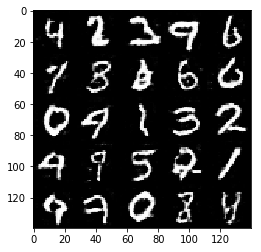

Epoch 2/2... Discriminator Loss: 1.7251... Generator Loss: 4.7178
Epoch 2/2... Discriminator Loss: 1.3231... Generator Loss: 0.5172
Epoch 2/2... Discriminator Loss: 2.6911... Generator Loss: 0.1240
Epoch 2/2... Discriminator Loss: 0.6740... Generator Loss: 1.1281
Epoch 2/2... Discriminator Loss: 0.2150... Generator Loss: 2.5448
Epoch 2/2... Discriminator Loss: 2.7427... Generator Loss: 0.1159
Epoch 2/2... Discriminator Loss: 1.2337... Generator Loss: 0.7483
Epoch 2/2... Discriminator Loss: 1.1485... Generator Loss: 0.7527
Epoch 2/2... Discriminator Loss: 1.9221... Generator Loss: 0.4049
Epoch 2/2... Discriminator Loss: 1.5838... Generator Loss: 0.3536


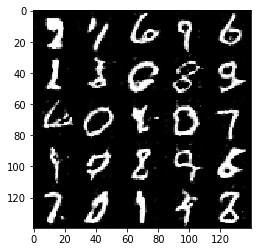

Epoch 2/2... Discriminator Loss: 0.9878... Generator Loss: 0.6368
Epoch 2/2... Discriminator Loss: 1.9750... Generator Loss: 0.2577
Epoch 2/2... Discriminator Loss: 1.0020... Generator Loss: 0.9439
Epoch 2/2... Discriminator Loss: 0.7445... Generator Loss: 1.1404
Epoch 2/2... Discriminator Loss: 1.7717... Generator Loss: 0.3626
Epoch 2/2... Discriminator Loss: 0.3105... Generator Loss: 2.7049
Epoch 2/2... Discriminator Loss: 0.8090... Generator Loss: 1.1562
Epoch 2/2... Discriminator Loss: 0.3221... Generator Loss: 1.7074
Epoch 2/2... Discriminator Loss: 0.7861... Generator Loss: 0.7998
Epoch 2/2... Discriminator Loss: 0.4017... Generator Loss: 1.8890


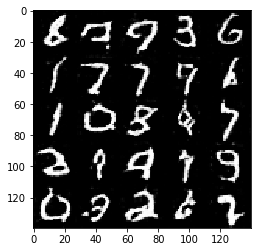

Epoch 2/2... Discriminator Loss: 1.4964... Generator Loss: 0.5934
Epoch 2/2... Discriminator Loss: 3.0548... Generator Loss: 0.1572
Epoch 2/2... Discriminator Loss: 0.5268... Generator Loss: 1.4820
Epoch 2/2... Discriminator Loss: 2.5628... Generator Loss: 0.1274
Epoch 2/2... Discriminator Loss: 0.7611... Generator Loss: 1.0908
Epoch 2/2... Discriminator Loss: 1.1579... Generator Loss: 0.9062
Epoch 2/2... Discriminator Loss: 1.8082... Generator Loss: 0.7385
Epoch 2/2... Discriminator Loss: 0.9356... Generator Loss: 1.6762
Epoch 2/2... Discriminator Loss: 0.3660... Generator Loss: 2.2953
Epoch 2/2... Discriminator Loss: 1.0101... Generator Loss: 0.9843


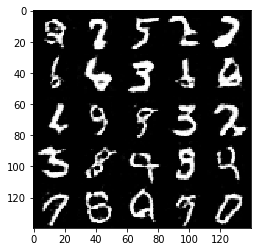

Epoch 2/2... Discriminator Loss: 1.3721... Generator Loss: 0.8329
Epoch 2/2... Discriminator Loss: 0.9310... Generator Loss: 1.2614
Epoch 2/2... Discriminator Loss: 0.6193... Generator Loss: 1.2410
Epoch 2/2... Discriminator Loss: 0.4495... Generator Loss: 1.7618
Epoch 2/2... Discriminator Loss: 0.2729... Generator Loss: 1.9178
Epoch 2/2... Discriminator Loss: 0.2532... Generator Loss: 3.1688
Epoch 2/2... Discriminator Loss: 0.6686... Generator Loss: 1.4324
Epoch 2/2... Discriminator Loss: 1.4152... Generator Loss: 0.5150
Epoch 2/2... Discriminator Loss: 1.4549... Generator Loss: 0.8500
Epoch 2/2... Discriminator Loss: 1.5181... Generator Loss: 0.5167


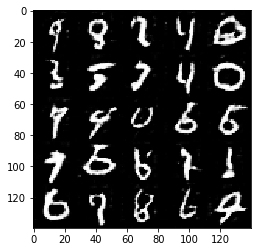

Epoch 2/2... Discriminator Loss: 1.0797... Generator Loss: 0.6450
Epoch 2/2... Discriminator Loss: 1.2459... Generator Loss: 0.6107
Epoch 2/2... Discriminator Loss: 1.2351... Generator Loss: 0.6082
Epoch 2/2... Discriminator Loss: 1.2676... Generator Loss: 0.4957
Epoch 2/2... Discriminator Loss: 1.5655... Generator Loss: 0.3675
Epoch 2/2... Discriminator Loss: 1.0332... Generator Loss: 0.8165
Epoch 2/2... Discriminator Loss: 0.9925... Generator Loss: 1.1028
Epoch 2/2... Discriminator Loss: 1.6030... Generator Loss: 0.7567
Epoch 2/2... Discriminator Loss: 1.7594... Generator Loss: 0.4900
Epoch 2/2... Discriminator Loss: 1.4114... Generator Loss: 0.5891


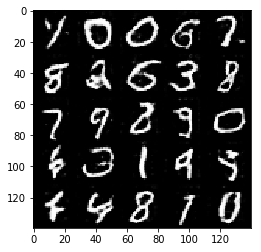

Epoch 2/2... Discriminator Loss: 2.6100... Generator Loss: 0.1394
Epoch 2/2... Discriminator Loss: 0.6605... Generator Loss: 1.0008
Epoch 2/2... Discriminator Loss: 1.1126... Generator Loss: 0.7910
Epoch 2/2... Discriminator Loss: 0.8769... Generator Loss: 0.7169
Epoch 2/2... Discriminator Loss: 0.3875... Generator Loss: 1.6654
Epoch 2/2... Discriminator Loss: 1.0920... Generator Loss: 0.5958
Epoch 2/2... Discriminator Loss: 1.0835... Generator Loss: 0.6527
Epoch 2/2... Discriminator Loss: 2.1391... Generator Loss: 0.2135
Epoch 2/2... Discriminator Loss: 0.6403... Generator Loss: 1.1120
Epoch 2/2... Discriminator Loss: 2.1308... Generator Loss: 0.3010


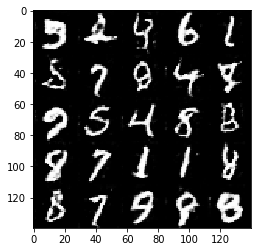

Epoch 2/2... Discriminator Loss: 0.7231... Generator Loss: 1.0421
Epoch 2/2... Discriminator Loss: 0.7282... Generator Loss: 1.4012
Epoch 2/2... Discriminator Loss: 1.2291... Generator Loss: 4.3017
Epoch 2/2... Discriminator Loss: 0.1623... Generator Loss: 3.2541
Epoch 2/2... Discriminator Loss: 2.8552... Generator Loss: 0.1464
Epoch 2/2... Discriminator Loss: 0.7749... Generator Loss: 1.0903
Epoch 2/2... Discriminator Loss: 0.4895... Generator Loss: 2.0531
Epoch 2/2... Discriminator Loss: 1.0144... Generator Loss: 0.6373
Epoch 2/2... Discriminator Loss: 0.3059... Generator Loss: 2.5555
Epoch 2/2... Discriminator Loss: 1.0615... Generator Loss: 0.7076


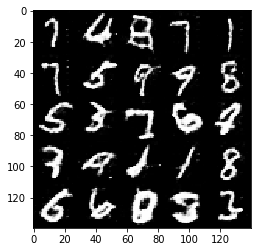

Epoch 2/2... Discriminator Loss: 0.8428... Generator Loss: 1.2090
Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.7507
Epoch 2/2... Discriminator Loss: 0.4552... Generator Loss: 1.5119
Epoch 2/2... Discriminator Loss: 0.8791... Generator Loss: 0.8474
Epoch 2/2... Discriminator Loss: 2.0778... Generator Loss: 0.3241
Epoch 2/2... Discriminator Loss: 0.3998... Generator Loss: 1.4389
Epoch 2/2... Discriminator Loss: 1.9748... Generator Loss: 0.3444
Epoch 2/2... Discriminator Loss: 0.9547... Generator Loss: 0.8303
Epoch 2/2... Discriminator Loss: 1.8554... Generator Loss: 0.4135
Epoch 2/2... Discriminator Loss: 0.2306... Generator Loss: 2.4207


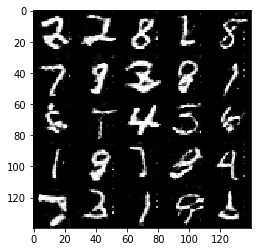

Epoch 2/2... Discriminator Loss: 1.1094... Generator Loss: 3.8523
Epoch 2/2... Discriminator Loss: 0.7583... Generator Loss: 0.9834
Epoch 2/2... Discriminator Loss: 0.3256... Generator Loss: 2.3191
Epoch 2/2... Discriminator Loss: 0.4276... Generator Loss: 1.7002
Epoch 2/2... Discriminator Loss: 1.9113... Generator Loss: 0.3300
Epoch 2/2... Discriminator Loss: 1.2241... Generator Loss: 0.6415
Epoch 2/2... Discriminator Loss: 1.0789... Generator Loss: 0.6448
Epoch 2/2... Discriminator Loss: 3.1198... Generator Loss: 0.1321
Epoch 2/2... Discriminator Loss: 0.3536... Generator Loss: 1.4739
Epoch 2/2... Discriminator Loss: 1.1161... Generator Loss: 0.5903


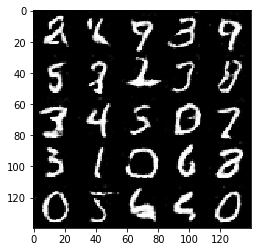

Epoch 2/2... Discriminator Loss: 0.7616... Generator Loss: 1.1316
Epoch 2/2... Discriminator Loss: 0.9337... Generator Loss: 0.7513
Epoch 2/2... Discriminator Loss: 0.3252... Generator Loss: 2.1097
Epoch 2/2... Discriminator Loss: 0.2062... Generator Loss: 2.1802
Epoch 2/2... Discriminator Loss: 1.0440... Generator Loss: 4.2815
Epoch 2/2... Discriminator Loss: 1.6806... Generator Loss: 0.5412
Epoch 2/2... Discriminator Loss: 1.3732... Generator Loss: 0.5347
Epoch 2/2... Discriminator Loss: 1.2289... Generator Loss: 0.5811
Epoch 2/2... Discriminator Loss: 1.5289... Generator Loss: 0.7835
Epoch 2/2... Discriminator Loss: 0.5207... Generator Loss: 1.2279


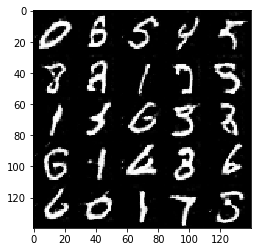

Epoch 2/2... Discriminator Loss: 0.8020... Generator Loss: 0.9151
Epoch 2/2... Discriminator Loss: 1.3415... Generator Loss: 0.6268
Epoch 2/2... Discriminator Loss: 0.5253... Generator Loss: 1.8806
Epoch 2/2... Discriminator Loss: 0.5906... Generator Loss: 1.3634
Epoch 2/2... Discriminator Loss: 0.7718... Generator Loss: 6.5480
Epoch 2/2... Discriminator Loss: 2.2862... Generator Loss: 0.2369
Epoch 2/2... Discriminator Loss: 1.6151... Generator Loss: 0.6624
Epoch 2/2... Discriminator Loss: 2.2734... Generator Loss: 0.2882
Epoch 2/2... Discriminator Loss: 0.3658... Generator Loss: 1.5306
Epoch 2/2... Discriminator Loss: 0.3381... Generator Loss: 3.9423


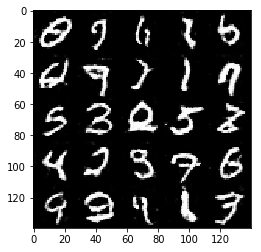

Epoch 2/2... Discriminator Loss: 0.4719... Generator Loss: 1.8551
Epoch 2/2... Discriminator Loss: 0.6487... Generator Loss: 1.0158
Epoch 2/2... Discriminator Loss: 2.5558... Generator Loss: 0.1773
Epoch 2/2... Discriminator Loss: 0.5608... Generator Loss: 1.4559
Epoch 2/2... Discriminator Loss: 0.5602... Generator Loss: 1.3623
Epoch 2/2... Discriminator Loss: 1.3947... Generator Loss: 0.5053
Epoch 2/2... Discriminator Loss: 1.2334... Generator Loss: 0.5044
Epoch 2/2... Discriminator Loss: 1.1686... Generator Loss: 0.5856
Epoch 2/2... Discriminator Loss: 0.5033... Generator Loss: 1.2889
Epoch 2/2... Discriminator Loss: 2.2132... Generator Loss: 0.2627


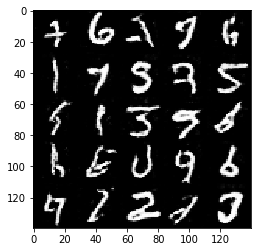

Epoch 2/2... Discriminator Loss: 1.0199... Generator Loss: 0.6969
Epoch 2/2... Discriminator Loss: 0.6028... Generator Loss: 1.2108
Epoch 2/2... Discriminator Loss: 0.4377... Generator Loss: 1.8400
Epoch 2/2... Discriminator Loss: 0.5202... Generator Loss: 1.1528
Epoch 2/2... Discriminator Loss: 0.3317... Generator Loss: 2.8072
Epoch 2/2... Discriminator Loss: 0.3729... Generator Loss: 5.4833
Epoch 2/2... Discriminator Loss: 0.3493... Generator Loss: 1.6481
Epoch 2/2... Discriminator Loss: 0.5760... Generator Loss: 1.5343
Epoch 2/2... Discriminator Loss: 1.1500... Generator Loss: 0.6820
Epoch 2/2... Discriminator Loss: 0.4762... Generator Loss: 1.8997


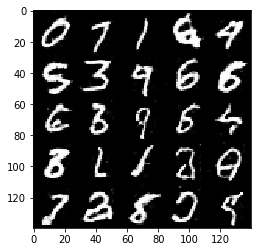

Epoch 2/2... Discriminator Loss: 1.4578... Generator Loss: 0.7216
Epoch 2/2... Discriminator Loss: 3.3057... Generator Loss: 0.0937
Epoch 2/2... Discriminator Loss: 0.7158... Generator Loss: 1.3446
Epoch 2/2... Discriminator Loss: 0.8796... Generator Loss: 0.9172
Epoch 2/2... Discriminator Loss: 0.3984... Generator Loss: 1.9298
Epoch 2/2... Discriminator Loss: 0.5329... Generator Loss: 1.5459
Epoch 2/2... Discriminator Loss: 1.0496... Generator Loss: 0.7485
Epoch 2/2... Discriminator Loss: 0.5929... Generator Loss: 1.1236
Epoch 2/2... Discriminator Loss: 0.6210... Generator Loss: 0.9833
Epoch 2/2... Discriminator Loss: 0.7447... Generator Loss: 1.1382


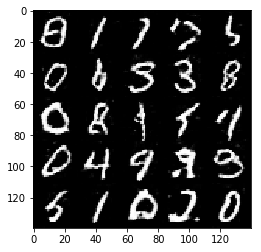

Epoch 2/2... Discriminator Loss: 0.9284... Generator Loss: 1.2667
Epoch 2/2... Discriminator Loss: 3.5399... Generator Loss: 0.0737
Epoch 2/2... Discriminator Loss: 0.6131... Generator Loss: 1.5041
Epoch 2/2... Discriminator Loss: 0.4841... Generator Loss: 1.2566
Epoch 2/2... Discriminator Loss: 1.3644... Generator Loss: 0.4227
Epoch 2/2... Discriminator Loss: 0.9955... Generator Loss: 0.8539
Epoch 2/2... Discriminator Loss: 1.7714... Generator Loss: 0.3110
Epoch 2/2... Discriminator Loss: 1.3950... Generator Loss: 0.5005
Epoch 2/2... Discriminator Loss: 3.4067... Generator Loss: 0.1158
Epoch 2/2... Discriminator Loss: 0.3640... Generator Loss: 2.2183


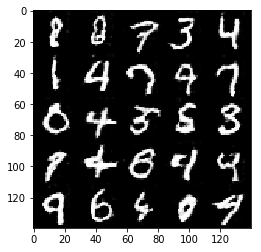

Epoch 2/2... Discriminator Loss: 0.5197... Generator Loss: 1.3678
Epoch 2/2... Discriminator Loss: 0.6826... Generator Loss: 1.1559
Epoch 2/2... Discriminator Loss: 0.6316... Generator Loss: 1.2226
Epoch 2/2... Discriminator Loss: 0.3253... Generator Loss: 1.8084
Epoch 2/2... Discriminator Loss: 0.6710... Generator Loss: 1.2680
Epoch 2/2... Discriminator Loss: 0.8135... Generator Loss: 1.0461
Epoch 2/2... Discriminator Loss: 0.4429... Generator Loss: 4.0826
Epoch 2/2... Discriminator Loss: 0.0514... Generator Loss: 3.9459
Epoch 2/2... Discriminator Loss: 6.0969... Generator Loss: 0.0454
Epoch 2/2... Discriminator Loss: 0.2360... Generator Loss: 2.9583


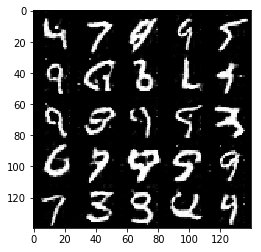

In [13]:
batch_size = 20
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 5.6746... Generator Loss: 0.0315
Epoch 1/1... Discriminator Loss: 0.3309... Generator Loss: 4.9677
Epoch 1/1... Discriminator Loss: 1.6137... Generator Loss: 15.5639
Epoch 1/1... Discriminator Loss: 11.6202... Generator Loss: 0.0002
Epoch 1/1... Discriminator Loss: 4.8485... Generator Loss: 0.2125
Epoch 1/1... Discriminator Loss: 3.9374... Generator Loss: 0.3831
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 2.1335
Epoch 1/1... Discriminator Loss: 1.1628... Generator Loss: 0.9225
Epoch 1/1... Discriminator Loss: 0.6684... Generator Loss: 2.0315
Epoch 1/1... Discriminator Loss: 3.0498... Generator Loss: 0.0617


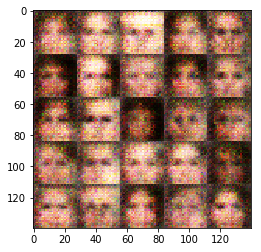

Epoch 1/1... Discriminator Loss: 0.6209... Generator Loss: 2.8355
Epoch 1/1... Discriminator Loss: 3.2556... Generator Loss: 7.2319
Epoch 1/1... Discriminator Loss: 0.6842... Generator Loss: 1.5068
Epoch 1/1... Discriminator Loss: 3.0637... Generator Loss: 0.0684
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.9716
Epoch 1/1... Discriminator Loss: 0.8776... Generator Loss: 1.0066
Epoch 1/1... Discriminator Loss: 2.0963... Generator Loss: 0.1859
Epoch 1/1... Discriminator Loss: 0.5612... Generator Loss: 2.5513
Epoch 1/1... Discriminator Loss: 0.9764... Generator Loss: 2.7788
Epoch 1/1... Discriminator Loss: 1.9344... Generator Loss: 0.2444


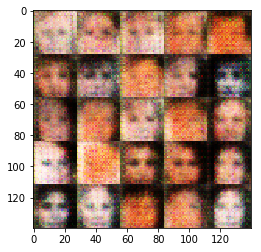

Epoch 1/1... Discriminator Loss: 0.7028... Generator Loss: 1.1733
Epoch 1/1... Discriminator Loss: 1.7703... Generator Loss: 5.0868
Epoch 1/1... Discriminator Loss: 0.7672... Generator Loss: 1.3088
Epoch 1/1... Discriminator Loss: 3.3846... Generator Loss: 0.0864
Epoch 1/1... Discriminator Loss: 2.1709... Generator Loss: 1.2246
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.9005
Epoch 1/1... Discriminator Loss: 0.8243... Generator Loss: 1.0223
Epoch 1/1... Discriminator Loss: 2.5275... Generator Loss: 0.1540
Epoch 1/1... Discriminator Loss: 1.0119... Generator Loss: 0.9410
Epoch 1/1... Discriminator Loss: 3.7415... Generator Loss: 0.2570


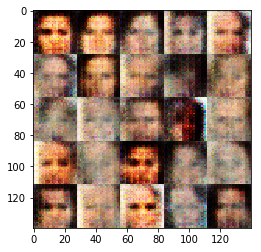

Epoch 1/1... Discriminator Loss: 4.4293... Generator Loss: 6.2915
Epoch 1/1... Discriminator Loss: 0.4902... Generator Loss: 1.5318
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.5638
Epoch 1/1... Discriminator Loss: 1.0998... Generator Loss: 0.8252
Epoch 1/1... Discriminator Loss: 2.1319... Generator Loss: 0.2218
Epoch 1/1... Discriminator Loss: 2.7572... Generator Loss: 0.1283
Epoch 1/1... Discriminator Loss: 1.5815... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 2.1834... Generator Loss: 0.2936
Epoch 1/1... Discriminator Loss: 1.0667... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 2.0108... Generator Loss: 0.2096


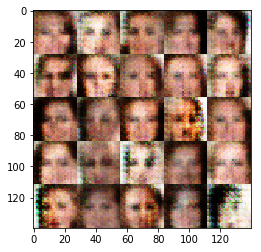

Epoch 1/1... Discriminator Loss: 2.4492... Generator Loss: 0.2490
Epoch 1/1... Discriminator Loss: 1.0866... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.8504... Generator Loss: 0.3411
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 3.8025... Generator Loss: 0.0573
Epoch 1/1... Discriminator Loss: 1.0348... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 2.0800... Generator Loss: 0.2632
Epoch 1/1... Discriminator Loss: 1.5440... Generator Loss: 0.9014
Epoch 1/1... Discriminator Loss: 1.5389... Generator Loss: 0.4361
Epoch 1/1... Discriminator Loss: 1.1357... Generator Loss: 2.7459


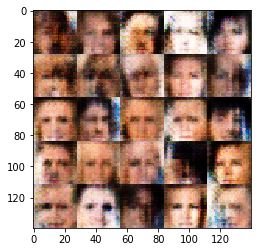

Epoch 1/1... Discriminator Loss: 3.2871... Generator Loss: 0.0566
Epoch 1/1... Discriminator Loss: 2.2469... Generator Loss: 4.0582
Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 0.5669
Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 2.5777
Epoch 1/1... Discriminator Loss: 2.6896... Generator Loss: 0.1231
Epoch 1/1... Discriminator Loss: 0.7431... Generator Loss: 1.4901
Epoch 1/1... Discriminator Loss: 2.2657... Generator Loss: 0.1642
Epoch 1/1... Discriminator Loss: 0.6009... Generator Loss: 1.1481
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.7766
Epoch 1/1... Discriminator Loss: 0.7463... Generator Loss: 1.1063


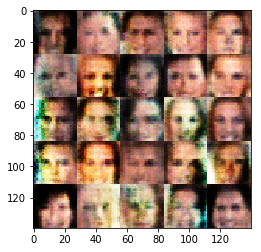

Epoch 1/1... Discriminator Loss: 1.6941... Generator Loss: 0.2874
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 1.3782
Epoch 1/1... Discriminator Loss: 2.1539... Generator Loss: 0.2426
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.7151
Epoch 1/1... Discriminator Loss: 1.5277... Generator Loss: 0.4554
Epoch 1/1... Discriminator Loss: 2.0816... Generator Loss: 0.1812
Epoch 1/1... Discriminator Loss: 1.0994... Generator Loss: 0.7186
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.4631
Epoch 1/1... Discriminator Loss: 0.7488... Generator Loss: 2.1325
Epoch 1/1... Discriminator Loss: 0.8207... Generator Loss: 2.1985


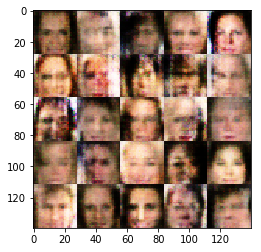

Epoch 1/1... Discriminator Loss: 2.3441... Generator Loss: 0.1671
Epoch 1/1... Discriminator Loss: 0.9017... Generator Loss: 1.0915
Epoch 1/1... Discriminator Loss: 1.8519... Generator Loss: 0.2272
Epoch 1/1... Discriminator Loss: 1.5483... Generator Loss: 0.4937
Epoch 1/1... Discriminator Loss: 0.9890... Generator Loss: 2.4126
Epoch 1/1... Discriminator Loss: 0.6713... Generator Loss: 1.3724
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.4202
Epoch 1/1... Discriminator Loss: 1.7575... Generator Loss: 0.2234
Epoch 1/1... Discriminator Loss: 1.4487... Generator Loss: 0.5597
Epoch 1/1... Discriminator Loss: 1.4905... Generator Loss: 0.4923


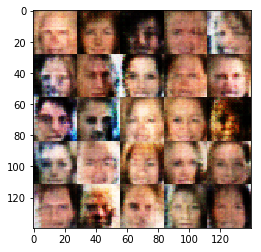

Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 1.1391
Epoch 1/1... Discriminator Loss: 1.2988... Generator Loss: 0.5181
Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.5001
Epoch 1/1... Discriminator Loss: 0.9089... Generator Loss: 2.5346
Epoch 1/1... Discriminator Loss: 1.1425... Generator Loss: 2.8759
Epoch 1/1... Discriminator Loss: 0.9506... Generator Loss: 2.0180
Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 0.8331... Generator Loss: 2.2838
Epoch 1/1... Discriminator Loss: 1.1069... Generator Loss: 1.8753
Epoch 1/1... Discriminator Loss: 1.0440... Generator Loss: 1.0731


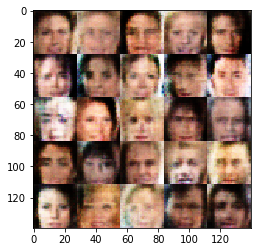

Epoch 1/1... Discriminator Loss: 1.5166... Generator Loss: 0.4067
Epoch 1/1... Discriminator Loss: 1.6495... Generator Loss: 0.3749
Epoch 1/1... Discriminator Loss: 1.7385... Generator Loss: 0.3098
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.4572
Epoch 1/1... Discriminator Loss: 1.8510... Generator Loss: 4.0157
Epoch 1/1... Discriminator Loss: 1.5074... Generator Loss: 0.3510
Epoch 1/1... Discriminator Loss: 1.7095... Generator Loss: 0.3328
Epoch 1/1... Discriminator Loss: 0.9440... Generator Loss: 0.8001
Epoch 1/1... Discriminator Loss: 0.8248... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 1.0181... Generator Loss: 1.0065


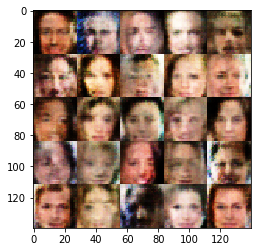

Epoch 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.4925
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 1.0118
Epoch 1/1... Discriminator Loss: 2.5302... Generator Loss: 0.1131
Epoch 1/1... Discriminator Loss: 0.9315... Generator Loss: 0.9395
Epoch 1/1... Discriminator Loss: 0.5663... Generator Loss: 1.2218
Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 0.4329
Epoch 1/1... Discriminator Loss: 0.7607... Generator Loss: 0.7695
Epoch 1/1... Discriminator Loss: 1.7142... Generator Loss: 0.3188
Epoch 1/1... Discriminator Loss: 1.6462... Generator Loss: 3.5054
Epoch 1/1... Discriminator Loss: 0.6911... Generator Loss: 1.4568


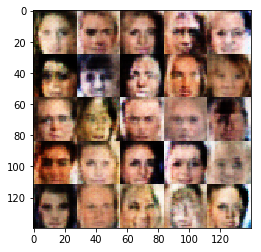

Epoch 1/1... Discriminator Loss: 1.2111... Generator Loss: 0.5809
Epoch 1/1... Discriminator Loss: 0.8322... Generator Loss: 1.3960
Epoch 1/1... Discriminator Loss: 0.9998... Generator Loss: 1.6656
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.4612
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 0.9842... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 0.9606... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 0.8350
Epoch 1/1... Discriminator Loss: 0.9697... Generator Loss: 0.7679
Epoch 1/1... Discriminator Loss: 1.0094... Generator Loss: 1.7149


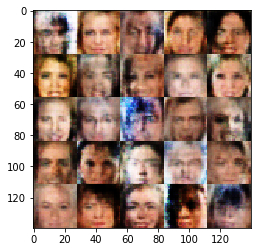

Epoch 1/1... Discriminator Loss: 1.0548... Generator Loss: 0.6648
Epoch 1/1... Discriminator Loss: 1.8653... Generator Loss: 0.2221
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 0.8313... Generator Loss: 2.3953
Epoch 1/1... Discriminator Loss: 1.0416... Generator Loss: 0.7392
Epoch 1/1... Discriminator Loss: 0.8543... Generator Loss: 0.8349
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 1.8796
Epoch 1/1... Discriminator Loss: 0.8754... Generator Loss: 0.8144
Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 0.5003
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 2.8790


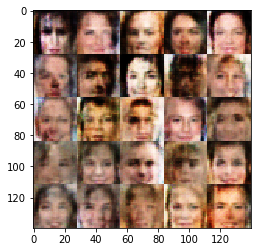

Epoch 1/1... Discriminator Loss: 0.8999... Generator Loss: 1.4207
Epoch 1/1... Discriminator Loss: 2.1842... Generator Loss: 0.1570
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.5005
Epoch 1/1... Discriminator Loss: 0.9228... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.9539... Generator Loss: 0.2125
Epoch 1/1... Discriminator Loss: 1.4730... Generator Loss: 0.3734
Epoch 1/1... Discriminator Loss: 0.6143... Generator Loss: 1.4478
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.5971
Epoch 1/1... Discriminator Loss: 1.2083... Generator Loss: 0.4540
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 1.9961


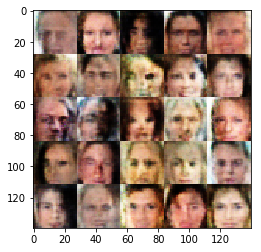

Epoch 1/1... Discriminator Loss: 1.0108... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 2.3374... Generator Loss: 0.1602
Epoch 1/1... Discriminator Loss: 0.9971... Generator Loss: 2.0191
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 0.8599... Generator Loss: 0.9936
Epoch 1/1... Discriminator Loss: 1.1192... Generator Loss: 0.8347
Epoch 1/1... Discriminator Loss: 0.7833... Generator Loss: 1.4214
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 1.2393
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.4048
Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 2.0380


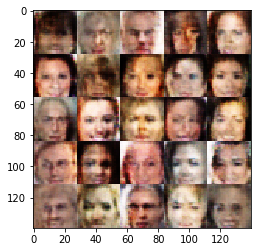

Epoch 1/1... Discriminator Loss: 1.8070... Generator Loss: 0.2665
Epoch 1/1... Discriminator Loss: 0.7615... Generator Loss: 1.0345
Epoch 1/1... Discriminator Loss: 0.7091... Generator Loss: 0.9803
Epoch 1/1... Discriminator Loss: 0.9352... Generator Loss: 1.3423
Epoch 1/1... Discriminator Loss: 1.1081... Generator Loss: 1.2327
Epoch 1/1... Discriminator Loss: 1.0429... Generator Loss: 2.1018
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 1.8088
Epoch 1/1... Discriminator Loss: 0.8808... Generator Loss: 1.2079
Epoch 1/1... Discriminator Loss: 1.0872... Generator Loss: 0.7330


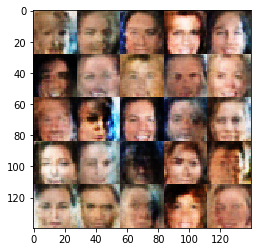

Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.5395
Epoch 1/1... Discriminator Loss: 2.5381... Generator Loss: 0.1265
Epoch 1/1... Discriminator Loss: 1.6088... Generator Loss: 0.3300
Epoch 1/1... Discriminator Loss: 0.9165... Generator Loss: 0.9213
Epoch 1/1... Discriminator Loss: 0.5511... Generator Loss: 3.1792
Epoch 1/1... Discriminator Loss: 0.8734... Generator Loss: 1.5453
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.5326... Generator Loss: 0.3361
Epoch 1/1... Discriminator Loss: 0.9376... Generator Loss: 0.6765
Epoch 1/1... Discriminator Loss: 1.7464... Generator Loss: 0.2592


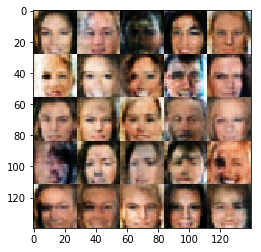

Epoch 1/1... Discriminator Loss: 1.0235... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 2.2865... Generator Loss: 0.1498
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 1.6856
Epoch 1/1... Discriminator Loss: 0.8218... Generator Loss: 1.5847
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.5856
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 1.7687
Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 0.7495
Epoch 1/1... Discriminator Loss: 0.8507... Generator Loss: 0.9061
Epoch 1/1... Discriminator Loss: 1.6518... Generator Loss: 0.3183
Epoch 1/1... Discriminator Loss: 2.0441... Generator Loss: 0.1702


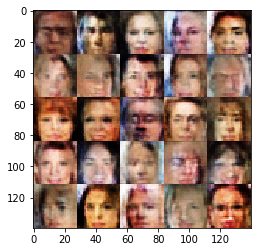

Epoch 1/1... Discriminator Loss: 0.7344... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 0.7472... Generator Loss: 1.5252
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 1.0178
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 2.3426
Epoch 1/1... Discriminator Loss: 1.9656... Generator Loss: 0.2027
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.4763
Epoch 1/1... Discriminator Loss: 1.7107... Generator Loss: 0.3763
Epoch 1/1... Discriminator Loss: 0.9621... Generator Loss: 1.2584
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.3457
Epoch 1/1... Discriminator Loss: 0.6360... Generator Loss: 1.1920


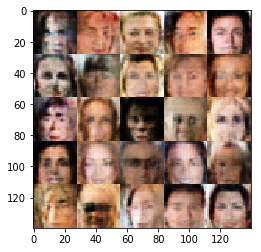

Epoch 1/1... Discriminator Loss: 1.2140... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 0.8082... Generator Loss: 1.5355
Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 1.3327
Epoch 1/1... Discriminator Loss: 1.4687... Generator Loss: 0.4741
Epoch 1/1... Discriminator Loss: 1.6971... Generator Loss: 0.2737
Epoch 1/1... Discriminator Loss: 0.6886... Generator Loss: 1.1638
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 1.4865
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 1.9865
Epoch 1/1... Discriminator Loss: 1.1982... Generator Loss: 0.5608
Epoch 1/1... Discriminator Loss: 1.1741... Generator Loss: 0.7564


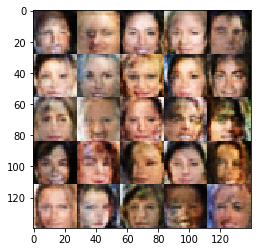

Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 0.4150
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 0.6005
Epoch 1/1... Discriminator Loss: 1.2067... Generator Loss: 0.6539
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.4645
Epoch 1/1... Discriminator Loss: 1.2299... Generator Loss: 0.4349
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 1.4324
Epoch 1/1... Discriminator Loss: 1.0676... Generator Loss: 0.6897
Epoch 1/1... Discriminator Loss: 1.5105... Generator Loss: 0.4278
Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 0.5610
Epoch 1/1... Discriminator Loss: 0.6814... Generator Loss: 1.6613


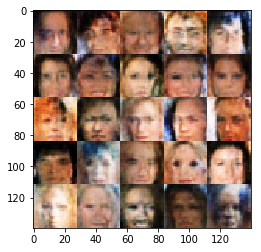

Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.4373
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.4573
Epoch 1/1... Discriminator Loss: 1.0823... Generator Loss: 0.8718
Epoch 1/1... Discriminator Loss: 1.9345... Generator Loss: 0.2742
Epoch 1/1... Discriminator Loss: 0.8933... Generator Loss: 1.5872
Epoch 1/1... Discriminator Loss: 1.4835... Generator Loss: 0.4522
Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.6323
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 1.3010
Epoch 1/1... Discriminator Loss: 0.8629... Generator Loss: 0.8792


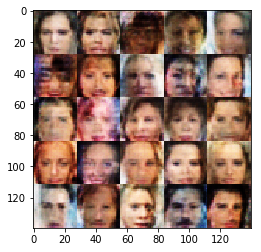

Epoch 1/1... Discriminator Loss: 1.6241... Generator Loss: 0.4125
Epoch 1/1... Discriminator Loss: 1.1262... Generator Loss: 0.9484
Epoch 1/1... Discriminator Loss: 1.7241... Generator Loss: 0.3928
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.4043
Epoch 1/1... Discriminator Loss: 1.8543... Generator Loss: 3.9459
Epoch 1/1... Discriminator Loss: 1.5221... Generator Loss: 0.3203
Epoch 1/1... Discriminator Loss: 0.8231... Generator Loss: 1.3111
Epoch 1/1... Discriminator Loss: 0.9857... Generator Loss: 1.6458
Epoch 1/1... Discriminator Loss: 1.2433... Generator Loss: 0.4331
Epoch 1/1... Discriminator Loss: 0.8293... Generator Loss: 0.9953


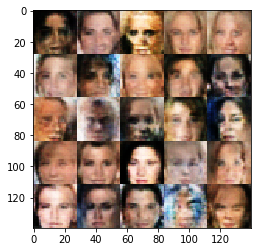

Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.4894
Epoch 1/1... Discriminator Loss: 1.0798... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.7275... Generator Loss: 0.4563
Epoch 1/1... Discriminator Loss: 0.6295... Generator Loss: 1.9396
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 0.4293... Generator Loss: 1.6473
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.4356
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 2.3601
Epoch 1/1... Discriminator Loss: 0.7759... Generator Loss: 3.0333


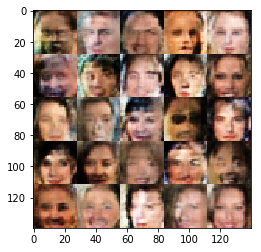

Epoch 1/1... Discriminator Loss: 0.9742... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 0.8192
Epoch 1/1... Discriminator Loss: 0.4712... Generator Loss: 2.2610
Epoch 1/1... Discriminator Loss: 0.7667... Generator Loss: 1.9161
Epoch 1/1... Discriminator Loss: 1.5855... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 2.6339... Generator Loss: 0.1210
Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 2.1462
Epoch 1/1... Discriminator Loss: 0.6978... Generator Loss: 1.3969
Epoch 1/1... Discriminator Loss: 1.6190... Generator Loss: 0.4029
Epoch 1/1... Discriminator Loss: 0.6380... Generator Loss: 1.3450


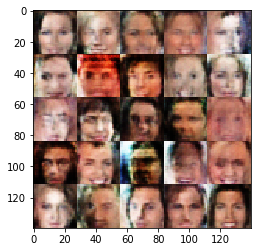

Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 0.8892
Epoch 1/1... Discriminator Loss: 1.5341... Generator Loss: 0.4520
Epoch 1/1... Discriminator Loss: 1.0701... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 0.5501... Generator Loss: 1.5638
Epoch 1/1... Discriminator Loss: 0.4060... Generator Loss: 2.0368
Epoch 1/1... Discriminator Loss: 0.4178... Generator Loss: 1.4416
Epoch 1/1... Discriminator Loss: 0.9314... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.1389... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 0.8366... Generator Loss: 1.8459
Epoch 1/1... Discriminator Loss: 0.2901... Generator Loss: 1.8428


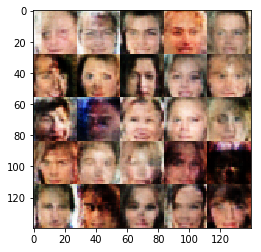

Epoch 1/1... Discriminator Loss: 0.2990... Generator Loss: 1.9590
Epoch 1/1... Discriminator Loss: 1.1081... Generator Loss: 7.1733
Epoch 1/1... Discriminator Loss: 0.2657... Generator Loss: 3.1353
Epoch 1/1... Discriminator Loss: 0.6544... Generator Loss: 1.4768
Epoch 1/1... Discriminator Loss: 0.7996... Generator Loss: 1.0307
Epoch 1/1... Discriminator Loss: 0.3500... Generator Loss: 1.5974
Epoch 1/1... Discriminator Loss: 0.2755... Generator Loss: 2.0020
Epoch 1/1... Discriminator Loss: 1.7869... Generator Loss: 0.2595
Epoch 1/1... Discriminator Loss: 0.3943... Generator Loss: 2.1074
Epoch 1/1... Discriminator Loss: 0.8122... Generator Loss: 3.1168


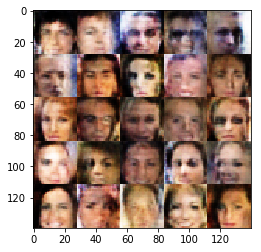

Epoch 1/1... Discriminator Loss: 1.6982... Generator Loss: 0.2960
Epoch 1/1... Discriminator Loss: 0.6632... Generator Loss: 0.9446
Epoch 1/1... Discriminator Loss: 2.2551... Generator Loss: 5.5358
Epoch 1/1... Discriminator Loss: 0.2326... Generator Loss: 2.6800
Epoch 1/1... Discriminator Loss: 0.4822... Generator Loss: 1.3921
Epoch 1/1... Discriminator Loss: 0.1905... Generator Loss: 3.9451
Epoch 1/1... Discriminator Loss: 0.2805... Generator Loss: 1.8970
Epoch 1/1... Discriminator Loss: 0.6525... Generator Loss: 1.0753
Epoch 1/1... Discriminator Loss: 0.8034... Generator Loss: 1.0779
Epoch 1/1... Discriminator Loss: 0.3111... Generator Loss: 1.9333


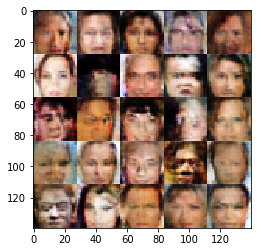

Epoch 1/1... Discriminator Loss: 0.3977... Generator Loss: 1.5056
Epoch 1/1... Discriminator Loss: 0.1576... Generator Loss: 3.2323
Epoch 1/1... Discriminator Loss: 0.1887... Generator Loss: 2.6731
Epoch 1/1... Discriminator Loss: 0.0746... Generator Loss: 5.2707
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 2.2924
Epoch 1/1... Discriminator Loss: 0.8259... Generator Loss: 2.2495
Epoch 1/1... Discriminator Loss: 0.9163... Generator Loss: 0.9398
Epoch 1/1... Discriminator Loss: 1.1956... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 0.6287... Generator Loss: 1.2653
Epoch 1/1... Discriminator Loss: 1.9869... Generator Loss: 0.2234


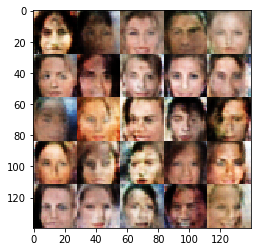

Epoch 1/1... Discriminator Loss: 0.3161... Generator Loss: 2.0498
Epoch 1/1... Discriminator Loss: 0.5245... Generator Loss: 1.3407
Epoch 1/1... Discriminator Loss: 0.4349... Generator Loss: 1.4112
Epoch 1/1... Discriminator Loss: 0.8223... Generator Loss: 0.8627
Epoch 1/1... Discriminator Loss: 0.2021... Generator Loss: 2.4679
Epoch 1/1... Discriminator Loss: 0.5182... Generator Loss: 1.5246
Epoch 1/1... Discriminator Loss: 1.2899... Generator Loss: 7.1553
Epoch 1/1... Discriminator Loss: 0.3606... Generator Loss: 1.3723
Epoch 1/1... Discriminator Loss: 0.1474... Generator Loss: 2.7914
Epoch 1/1... Discriminator Loss: 0.1434... Generator Loss: 2.7826


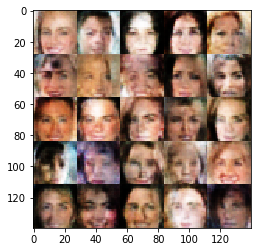

Epoch 1/1... Discriminator Loss: 0.0259... Generator Loss: 4.3470
Epoch 1/1... Discriminator Loss: 0.7047... Generator Loss: 2.4982
Epoch 1/1... Discriminator Loss: 0.3709... Generator Loss: 1.5205
Epoch 1/1... Discriminator Loss: 0.1737... Generator Loss: 2.5204
Epoch 1/1... Discriminator Loss: 2.2120... Generator Loss: 4.3307
Epoch 1/1... Discriminator Loss: 0.2786... Generator Loss: 1.7507
Epoch 1/1... Discriminator Loss: 0.7969... Generator Loss: 0.9724
Epoch 1/1... Discriminator Loss: 0.8355... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.0582... Generator Loss: 0.5600
Epoch 1/1... Discriminator Loss: 0.2520... Generator Loss: 2.0744


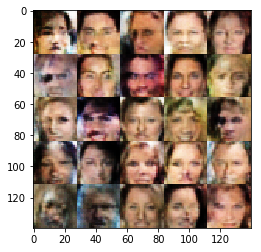

Epoch 1/1... Discriminator Loss: 0.6333... Generator Loss: 1.0370
Epoch 1/1... Discriminator Loss: 1.8524... Generator Loss: 0.4570
Epoch 1/1... Discriminator Loss: 0.1486... Generator Loss: 3.5647
Epoch 1/1... Discriminator Loss: 0.2871... Generator Loss: 4.5801
Epoch 1/1... Discriminator Loss: 0.3355... Generator Loss: 1.5427
Epoch 1/1... Discriminator Loss: 0.3507... Generator Loss: 2.0086
Epoch 1/1... Discriminator Loss: 0.2944... Generator Loss: 1.7426
Epoch 1/1... Discriminator Loss: 0.1213... Generator Loss: 3.4385
Epoch 1/1... Discriminator Loss: 0.4468... Generator Loss: 1.6314
Epoch 1/1... Discriminator Loss: 0.6059... Generator Loss: 3.5988


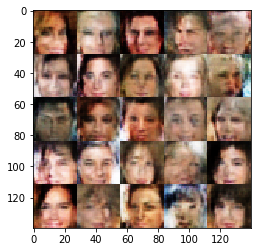

Epoch 1/1... Discriminator Loss: 0.3863... Generator Loss: 5.1631
Epoch 1/1... Discriminator Loss: 0.4537... Generator Loss: 1.8015
Epoch 1/1... Discriminator Loss: 0.1892... Generator Loss: 2.3053
Epoch 1/1... Discriminator Loss: 2.7372... Generator Loss: 0.1259
Epoch 1/1... Discriminator Loss: 0.0825... Generator Loss: 3.0548
Epoch 1/1... Discriminator Loss: 0.1328... Generator Loss: 3.1996
Epoch 1/1... Discriminator Loss: 2.1943... Generator Loss: 0.2133
Epoch 1/1... Discriminator Loss: 0.0869... Generator Loss: 5.7232
Epoch 1/1... Discriminator Loss: 0.4669... Generator Loss: 1.4099
Epoch 1/1... Discriminator Loss: 0.6106... Generator Loss: 1.1600


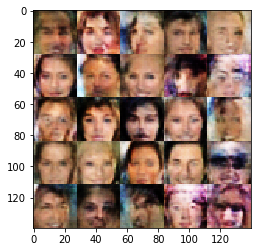

Epoch 1/1... Discriminator Loss: 0.1870... Generator Loss: 3.2368
Epoch 1/1... Discriminator Loss: 0.1385... Generator Loss: 6.3810
Epoch 1/1... Discriminator Loss: 0.3100... Generator Loss: 4.4525
Epoch 1/1... Discriminator Loss: 0.2248... Generator Loss: 6.7151
Epoch 1/1... Discriminator Loss: 0.0508... Generator Loss: 6.7093
Epoch 1/1... Discriminator Loss: 0.2886... Generator Loss: 2.2571
Epoch 1/1... Discriminator Loss: 0.1308... Generator Loss: 3.2833
Epoch 1/1... Discriminator Loss: 3.2922... Generator Loss: 0.0659
Epoch 1/1... Discriminator Loss: 0.0993... Generator Loss: 3.1463
Epoch 1/1... Discriminator Loss: 0.0952... Generator Loss: 3.1526


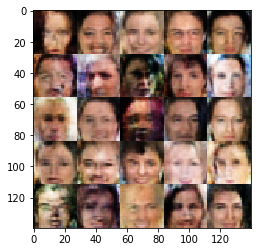

Epoch 1/1... Discriminator Loss: 0.2512... Generator Loss: 4.2465
Epoch 1/1... Discriminator Loss: 0.0801... Generator Loss: 3.6119
Epoch 1/1... Discriminator Loss: 0.2556... Generator Loss: 2.0143
Epoch 1/1... Discriminator Loss: 0.0549... Generator Loss: 6.0560
Epoch 1/1... Discriminator Loss: 0.6531... Generator Loss: 2.9445
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.5217
Epoch 1/1... Discriminator Loss: 0.0757... Generator Loss: 5.8074
Epoch 1/1... Discriminator Loss: 0.0906... Generator Loss: 3.7978
Epoch 1/1... Discriminator Loss: 0.8185... Generator Loss: 4.1656
Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 1.4010


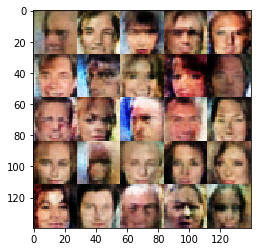

Epoch 1/1... Discriminator Loss: 0.1433... Generator Loss: 3.0288
Epoch 1/1... Discriminator Loss: 0.1488... Generator Loss: 2.8901
Epoch 1/1... Discriminator Loss: 0.0474... Generator Loss: 5.2479
Epoch 1/1... Discriminator Loss: 0.0827... Generator Loss: 4.3203
Epoch 1/1... Discriminator Loss: 0.2761... Generator Loss: 4.1560
Epoch 1/1... Discriminator Loss: 0.0533... Generator Loss: 6.2725
Epoch 1/1... Discriminator Loss: 0.1313... Generator Loss: 5.7517
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.5369
Epoch 1/1... Discriminator Loss: 0.6330... Generator Loss: 1.3245
Epoch 1/1... Discriminator Loss: 0.7890... Generator Loss: 1.1167


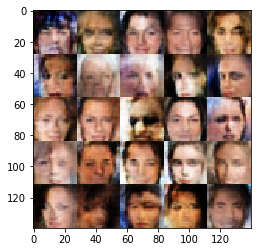

Epoch 1/1... Discriminator Loss: 0.0700... Generator Loss: 4.0854
Epoch 1/1... Discriminator Loss: 0.4008... Generator Loss: 1.7410
Epoch 1/1... Discriminator Loss: 0.4057... Generator Loss: 1.8434
Epoch 1/1... Discriminator Loss: 0.3732... Generator Loss: 2.0227
Epoch 1/1... Discriminator Loss: 0.3499... Generator Loss: 1.6467
Epoch 1/1... Discriminator Loss: 0.4425... Generator Loss: 2.0669
Epoch 1/1... Discriminator Loss: 0.6008... Generator Loss: 1.5677
Epoch 1/1... Discriminator Loss: 0.6617... Generator Loss: 5.7182
Epoch 1/1... Discriminator Loss: 0.1592... Generator Loss: 2.7436
Epoch 1/1... Discriminator Loss: 0.5391... Generator Loss: 1.6925


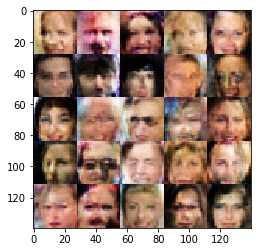

Epoch 1/1... Discriminator Loss: 0.1004... Generator Loss: 7.5970
Epoch 1/1... Discriminator Loss: 0.3562... Generator Loss: 2.9114
Epoch 1/1... Discriminator Loss: 0.3411... Generator Loss: 1.6842
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 0.2218... Generator Loss: 2.5107
Epoch 1/1... Discriminator Loss: 0.2919... Generator Loss: 1.9546
Epoch 1/1... Discriminator Loss: 0.6380... Generator Loss: 1.3929
Epoch 1/1... Discriminator Loss: 0.3222... Generator Loss: 1.8743
Epoch 1/1... Discriminator Loss: 0.7374... Generator Loss: 0.9565
Epoch 1/1... Discriminator Loss: 0.5120... Generator Loss: 1.5449


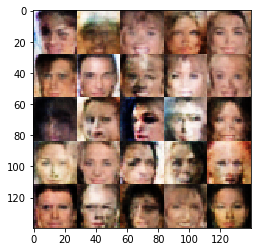

Epoch 1/1... Discriminator Loss: 0.0629... Generator Loss: 5.9124
Epoch 1/1... Discriminator Loss: 0.4511... Generator Loss: 1.8909
Epoch 1/1... Discriminator Loss: 0.2530... Generator Loss: 4.3329
Epoch 1/1... Discriminator Loss: 0.7143... Generator Loss: 7.3474
Epoch 1/1... Discriminator Loss: 0.1371... Generator Loss: 2.9824
Epoch 1/1... Discriminator Loss: 0.0879... Generator Loss: 3.8029
Epoch 1/1... Discriminator Loss: 0.1970... Generator Loss: 2.6410
Epoch 1/1... Discriminator Loss: 0.1919... Generator Loss: 8.2620
Epoch 1/1... Discriminator Loss: 0.1246... Generator Loss: 3.0369
Epoch 1/1... Discriminator Loss: 1.5275... Generator Loss: 0.4346


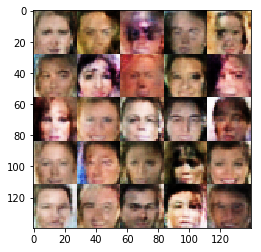

Epoch 1/1... Discriminator Loss: 2.3406... Generator Loss: 0.1434
Epoch 1/1... Discriminator Loss: 0.6635... Generator Loss: 1.0925
Epoch 1/1... Discriminator Loss: 0.5969... Generator Loss: 3.0492
Epoch 1/1... Discriminator Loss: 0.1274... Generator Loss: 2.9986
Epoch 1/1... Discriminator Loss: 0.0382... Generator Loss: 5.5890
Epoch 1/1... Discriminator Loss: 0.2113... Generator Loss: 6.3540
Epoch 1/1... Discriminator Loss: 0.4960... Generator Loss: 1.6872
Epoch 1/1... Discriminator Loss: 4.5258... Generator Loss: 0.0274
Epoch 1/1... Discriminator Loss: 0.3122... Generator Loss: 1.9190
Epoch 1/1... Discriminator Loss: 0.0947... Generator Loss: 3.4090


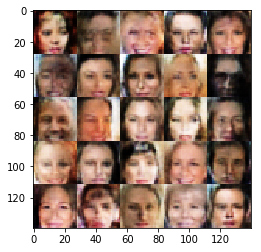

Epoch 1/1... Discriminator Loss: 0.0919... Generator Loss: 3.4766
Epoch 1/1... Discriminator Loss: 0.0898... Generator Loss: 2.9673
Epoch 1/1... Discriminator Loss: 0.7354... Generator Loss: 1.0939
Epoch 1/1... Discriminator Loss: 0.2794... Generator Loss: 4.0030
Epoch 1/1... Discriminator Loss: 1.0896... Generator Loss: 0.8534
Epoch 1/1... Discriminator Loss: 0.0645... Generator Loss: 4.1746
Epoch 1/1... Discriminator Loss: 0.1176... Generator Loss: 3.1266
Epoch 1/1... Discriminator Loss: 0.1103... Generator Loss: 3.4525
Epoch 1/1... Discriminator Loss: 1.1134... Generator Loss: 4.3286
Epoch 1/1... Discriminator Loss: 0.1793... Generator Loss: 3.1552


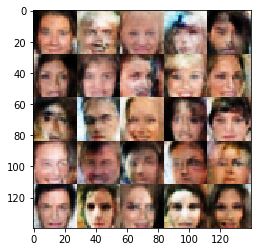

Epoch 1/1... Discriminator Loss: 0.2076... Generator Loss: 5.6385
Epoch 1/1... Discriminator Loss: 0.0744... Generator Loss: 3.8295
Epoch 1/1... Discriminator Loss: 0.1488... Generator Loss: 6.7016
Epoch 1/1... Discriminator Loss: 0.2370... Generator Loss: 2.1714
Epoch 1/1... Discriminator Loss: 1.5442... Generator Loss: 0.5704
Epoch 1/1... Discriminator Loss: 0.2138... Generator Loss: 2.5830
Epoch 1/1... Discriminator Loss: 0.0639... Generator Loss: 4.8324
Epoch 1/1... Discriminator Loss: 0.3580... Generator Loss: 1.8352
Epoch 1/1... Discriminator Loss: 1.6743... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 0.2476... Generator Loss: 2.6391


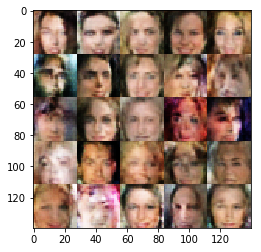

Epoch 1/1... Discriminator Loss: 0.2558... Generator Loss: 1.9324
Epoch 1/1... Discriminator Loss: 0.6511... Generator Loss: 1.3337
Epoch 1/1... Discriminator Loss: 0.6004... Generator Loss: 1.1050
Epoch 1/1... Discriminator Loss: 0.0774... Generator Loss: 3.5208
Epoch 1/1... Discriminator Loss: 1.8021... Generator Loss: 0.4594
Epoch 1/1... Discriminator Loss: 1.2285... Generator Loss: 0.5250
Epoch 1/1... Discriminator Loss: 2.3861... Generator Loss: 0.1590
Epoch 1/1... Discriminator Loss: 0.0831... Generator Loss: 4.3925
Epoch 1/1... Discriminator Loss: 1.9256... Generator Loss: 0.2592
Epoch 1/1... Discriminator Loss: 1.2252... Generator Loss: 6.4061


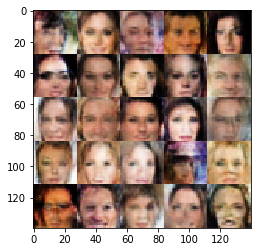

Epoch 1/1... Discriminator Loss: 0.2396... Generator Loss: 2.0156
Epoch 1/1... Discriminator Loss: 3.4654... Generator Loss: 0.0824
Epoch 1/1... Discriminator Loss: 0.6482... Generator Loss: 1.0505
Epoch 1/1... Discriminator Loss: 0.6927... Generator Loss: 1.1725
Epoch 1/1... Discriminator Loss: 1.0892... Generator Loss: 0.5610
Epoch 1/1... Discriminator Loss: 0.1085... Generator Loss: 3.4469
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 6.8841
Epoch 1/1... Discriminator Loss: 0.4691... Generator Loss: 1.5982
Epoch 1/1... Discriminator Loss: 0.2287... Generator Loss: 2.8651
Epoch 1/1... Discriminator Loss: 0.1919... Generator Loss: 2.7237


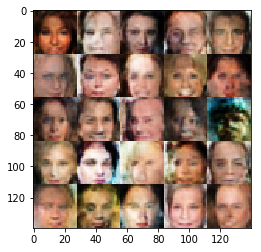

Epoch 1/1... Discriminator Loss: 0.6882... Generator Loss: 1.0946
Epoch 1/1... Discriminator Loss: 0.2214... Generator Loss: 3.0569
Epoch 1/1... Discriminator Loss: 0.1927... Generator Loss: 3.4768
Epoch 1/1... Discriminator Loss: 0.5349... Generator Loss: 1.5483
Epoch 1/1... Discriminator Loss: 0.2868... Generator Loss: 1.9127
Epoch 1/1... Discriminator Loss: 3.2572... Generator Loss: 0.0702
Epoch 1/1... Discriminator Loss: 0.3034... Generator Loss: 1.8564
Epoch 1/1... Discriminator Loss: 0.1368... Generator Loss: 3.0906
Epoch 1/1... Discriminator Loss: 0.2093... Generator Loss: 4.7384
Epoch 1/1... Discriminator Loss: 0.1705... Generator Loss: 3.8672


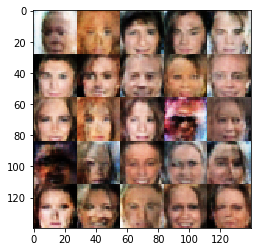

Epoch 1/1... Discriminator Loss: 0.8385... Generator Loss: 0.8177
Epoch 1/1... Discriminator Loss: 0.2781... Generator Loss: 4.2758
Epoch 1/1... Discriminator Loss: 0.4775... Generator Loss: 1.4834
Epoch 1/1... Discriminator Loss: 0.4938... Generator Loss: 2.3680
Epoch 1/1... Discriminator Loss: 0.2003... Generator Loss: 2.3530
Epoch 1/1... Discriminator Loss: 0.1228... Generator Loss: 4.4598
Epoch 1/1... Discriminator Loss: 0.3788... Generator Loss: 2.1695
Epoch 1/1... Discriminator Loss: 0.0345... Generator Loss: 4.2584
Epoch 1/1... Discriminator Loss: 0.4548... Generator Loss: 1.5216
Epoch 1/1... Discriminator Loss: 0.2401... Generator Loss: 5.6101


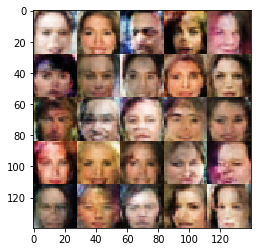

Epoch 1/1... Discriminator Loss: 0.1394... Generator Loss: 3.1003
Epoch 1/1... Discriminator Loss: 0.6482... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 0.1962... Generator Loss: 2.5730
Epoch 1/1... Discriminator Loss: 0.2138... Generator Loss: 3.7193
Epoch 1/1... Discriminator Loss: 2.1200... Generator Loss: 6.2170
Epoch 1/1... Discriminator Loss: 0.3325... Generator Loss: 2.2112
Epoch 1/1... Discriminator Loss: 1.4244... Generator Loss: 0.5862
Epoch 1/1... Discriminator Loss: 0.3775... Generator Loss: 1.8901
Epoch 1/1... Discriminator Loss: 2.0092... Generator Loss: 0.2768
Epoch 1/1... Discriminator Loss: 0.7846... Generator Loss: 0.8961


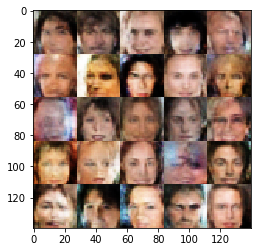

Epoch 1/1... Discriminator Loss: 0.3148... Generator Loss: 2.0648
Epoch 1/1... Discriminator Loss: 2.4852... Generator Loss: 0.1675
Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.4803
Epoch 1/1... Discriminator Loss: 0.0938... Generator Loss: 3.0866
Epoch 1/1... Discriminator Loss: 0.4149... Generator Loss: 1.7175
Epoch 1/1... Discriminator Loss: 0.1700... Generator Loss: 3.8068
Epoch 1/1... Discriminator Loss: 0.5025... Generator Loss: 1.2466
Epoch 1/1... Discriminator Loss: 0.6107... Generator Loss: 3.6216
Epoch 1/1... Discriminator Loss: 0.1482... Generator Loss: 2.6037
Epoch 1/1... Discriminator Loss: 1.0299... Generator Loss: 0.9872


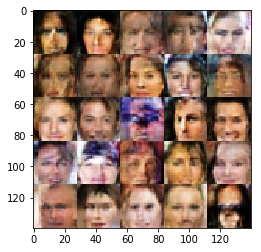

Epoch 1/1... Discriminator Loss: 0.2481... Generator Loss: 4.2074
Epoch 1/1... Discriminator Loss: 0.2319... Generator Loss: 2.1932
Epoch 1/1... Discriminator Loss: 0.3194... Generator Loss: 1.7633
Epoch 1/1... Discriminator Loss: 0.3360... Generator Loss: 1.7252
Epoch 1/1... Discriminator Loss: 0.6164... Generator Loss: 1.4270
Epoch 1/1... Discriminator Loss: 0.1880... Generator Loss: 4.9022
Epoch 1/1... Discriminator Loss: 0.5259... Generator Loss: 1.3552
Epoch 1/1... Discriminator Loss: 0.1221... Generator Loss: 5.3070
Epoch 1/1... Discriminator Loss: 0.7494... Generator Loss: 0.9884
Epoch 1/1... Discriminator Loss: 0.2004... Generator Loss: 5.8402


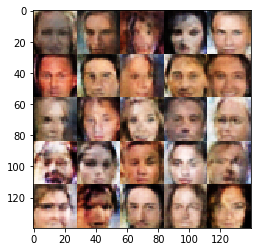

Epoch 1/1... Discriminator Loss: 0.2217... Generator Loss: 2.1860
Epoch 1/1... Discriminator Loss: 0.1469... Generator Loss: 2.6776
Epoch 1/1... Discriminator Loss: 0.7411... Generator Loss: 1.0356
Epoch 1/1... Discriminator Loss: 0.1757... Generator Loss: 2.5742
Epoch 1/1... Discriminator Loss: 3.2303... Generator Loss: 0.0972
Epoch 1/1... Discriminator Loss: 0.1695... Generator Loss: 2.6054
Epoch 1/1... Discriminator Loss: 0.0804... Generator Loss: 3.9252
Epoch 1/1... Discriminator Loss: 0.0587... Generator Loss: 4.0582
Epoch 1/1... Discriminator Loss: 0.2918... Generator Loss: 4.9749
Epoch 1/1... Discriminator Loss: 0.3526... Generator Loss: 1.6514


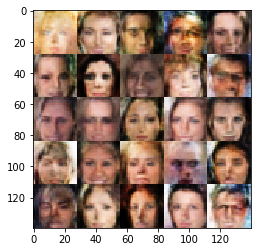

Epoch 1/1... Discriminator Loss: 0.7255... Generator Loss: 1.2725
Epoch 1/1... Discriminator Loss: 0.8384... Generator Loss: 1.0103
Epoch 1/1... Discriminator Loss: 0.2802... Generator Loss: 2.6486
Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 2.0925
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 1.0858
Epoch 1/1... Discriminator Loss: 0.2827... Generator Loss: 2.2879
Epoch 1/1... Discriminator Loss: 0.9190... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 0.4319... Generator Loss: 1.7671
Epoch 1/1... Discriminator Loss: 0.4494... Generator Loss: 1.7515
Epoch 1/1... Discriminator Loss: 0.0535... Generator Loss: 4.5264


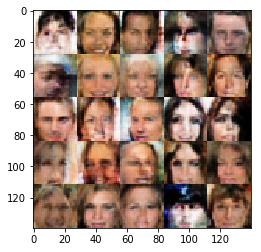

Epoch 1/1... Discriminator Loss: 0.2951... Generator Loss: 1.7545
Epoch 1/1... Discriminator Loss: 2.4972... Generator Loss: 10.9300
Epoch 1/1... Discriminator Loss: 0.2037... Generator Loss: 2.7819
Epoch 1/1... Discriminator Loss: 0.4668... Generator Loss: 1.4034
Epoch 1/1... Discriminator Loss: 0.3263... Generator Loss: 2.2405
Epoch 1/1... Discriminator Loss: 0.1617... Generator Loss: 2.6095
Epoch 1/1... Discriminator Loss: 0.8951... Generator Loss: 1.0128
Epoch 1/1... Discriminator Loss: 0.1263... Generator Loss: 4.9464
Epoch 1/1... Discriminator Loss: 0.4371... Generator Loss: 1.9997
Epoch 1/1... Discriminator Loss: 0.1683... Generator Loss: 4.1246


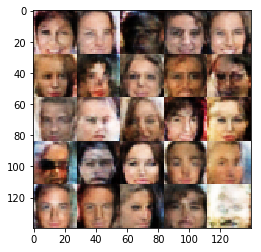

Epoch 1/1... Discriminator Loss: 0.2369... Generator Loss: 3.0297
Epoch 1/1... Discriminator Loss: 0.4362... Generator Loss: 1.8825
Epoch 1/1... Discriminator Loss: 0.0744... Generator Loss: 5.4210
Epoch 1/1... Discriminator Loss: 0.1220... Generator Loss: 6.7849
Epoch 1/1... Discriminator Loss: 0.1150... Generator Loss: 2.9891
Epoch 1/1... Discriminator Loss: 0.1858... Generator Loss: 6.0727
Epoch 1/1... Discriminator Loss: 1.9720... Generator Loss: 0.2577
Epoch 1/1... Discriminator Loss: 0.1616... Generator Loss: 2.6162
Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 5.3536
Epoch 1/1... Discriminator Loss: 0.1602... Generator Loss: 3.5653


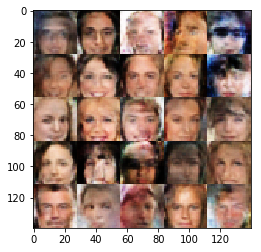

Epoch 1/1... Discriminator Loss: 0.3342... Generator Loss: 2.8655
Epoch 1/1... Discriminator Loss: 0.4419... Generator Loss: 1.3147
Epoch 1/1... Discriminator Loss: 1.1276... Generator Loss: 0.6731
Epoch 1/1... Discriminator Loss: 0.0642... Generator Loss: 4.0585
Epoch 1/1... Discriminator Loss: 0.0646... Generator Loss: 4.2746
Epoch 1/1... Discriminator Loss: 0.1717... Generator Loss: 2.4173
Epoch 1/1... Discriminator Loss: 0.1223... Generator Loss: 2.8493
Epoch 1/1... Discriminator Loss: 0.0532... Generator Loss: 6.1055
Epoch 1/1... Discriminator Loss: 0.1596... Generator Loss: 3.5656
Epoch 1/1... Discriminator Loss: 0.7456... Generator Loss: 1.2342


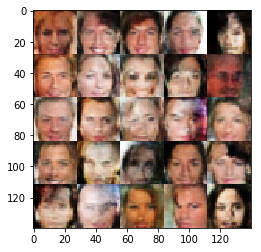

Epoch 1/1... Discriminator Loss: 0.0119... Generator Loss: 6.4382
Epoch 1/1... Discriminator Loss: 0.0522... Generator Loss: 4.6218
Epoch 1/1... Discriminator Loss: 0.6377... Generator Loss: 1.5289
Epoch 1/1... Discriminator Loss: 0.9367... Generator Loss: 1.4125
Epoch 1/1... Discriminator Loss: 0.1015... Generator Loss: 7.5412
Epoch 1/1... Discriminator Loss: 0.2424... Generator Loss: 2.4809
Epoch 1/1... Discriminator Loss: 0.1835... Generator Loss: 2.6406
Epoch 1/1... Discriminator Loss: 0.0467... Generator Loss: 5.9066
Epoch 1/1... Discriminator Loss: 0.3242... Generator Loss: 2.0499
Epoch 1/1... Discriminator Loss: 0.2220... Generator Loss: 2.9004


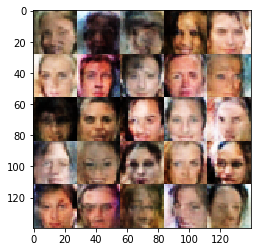

Epoch 1/1... Discriminator Loss: 0.3747... Generator Loss: 3.4424
Epoch 1/1... Discriminator Loss: 0.2025... Generator Loss: 3.3412
Epoch 1/1... Discriminator Loss: 0.3547... Generator Loss: 6.0331
Epoch 1/1... Discriminator Loss: 0.1654... Generator Loss: 2.7716
Epoch 1/1... Discriminator Loss: 0.2410... Generator Loss: 2.1753
Epoch 1/1... Discriminator Loss: 0.1171... Generator Loss: 3.1749
Epoch 1/1... Discriminator Loss: 0.2043... Generator Loss: 2.3111
Epoch 1/1... Discriminator Loss: 0.1644... Generator Loss: 2.4839
Epoch 1/1... Discriminator Loss: 0.1060... Generator Loss: 3.0849
Epoch 1/1... Discriminator Loss: 0.2848... Generator Loss: 3.1386


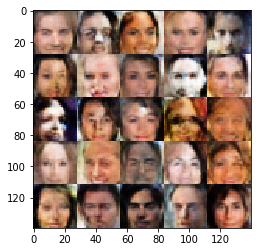

Epoch 1/1... Discriminator Loss: 0.3375... Generator Loss: 2.2576
Epoch 1/1... Discriminator Loss: 0.1109... Generator Loss: 4.7838
Epoch 1/1... Discriminator Loss: 0.0475... Generator Loss: 4.0568
Epoch 1/1... Discriminator Loss: 0.1586... Generator Loss: 5.3901
Epoch 1/1... Discriminator Loss: 0.2975... Generator Loss: 1.5786
Epoch 1/1... Discriminator Loss: 0.5686... Generator Loss: 1.3852
Epoch 1/1... Discriminator Loss: 3.5894... Generator Loss: 0.0845
Epoch 1/1... Discriminator Loss: 0.3091... Generator Loss: 2.1627
Epoch 1/1... Discriminator Loss: 0.2077... Generator Loss: 2.6741
Epoch 1/1... Discriminator Loss: 2.5320... Generator Loss: 0.3926


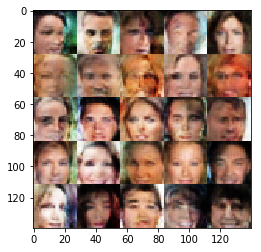

Epoch 1/1... Discriminator Loss: 0.2053... Generator Loss: 3.2493
Epoch 1/1... Discriminator Loss: 0.0429... Generator Loss: 5.5755
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 2.7971... Generator Loss: 0.0834
Epoch 1/1... Discriminator Loss: 0.0513... Generator Loss: 3.8993
Epoch 1/1... Discriminator Loss: 0.1084... Generator Loss: 3.2645
Epoch 1/1... Discriminator Loss: 0.1315... Generator Loss: 3.5546
Epoch 1/1... Discriminator Loss: 0.1354... Generator Loss: 3.1186
Epoch 1/1... Discriminator Loss: 0.3432... Generator Loss: 1.7398
Epoch 1/1... Discriminator Loss: 0.0392... Generator Loss: 5.2513


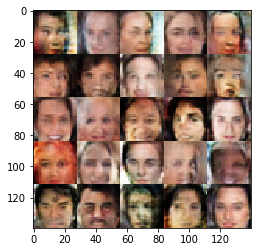

Epoch 1/1... Discriminator Loss: 0.0462... Generator Loss: 4.3091
Epoch 1/1... Discriminator Loss: 0.1023... Generator Loss: 7.1809
Epoch 1/1... Discriminator Loss: 0.0535... Generator Loss: 3.7643
Epoch 1/1... Discriminator Loss: 0.7816... Generator Loss: 6.6508
Epoch 1/1... Discriminator Loss: 0.0679... Generator Loss: 6.3850
Epoch 1/1... Discriminator Loss: 0.8812... Generator Loss: 1.0852
Epoch 1/1... Discriminator Loss: 1.9559... Generator Loss: 0.3446
Epoch 1/1... Discriminator Loss: 0.0062... Generator Loss: 7.1016
Epoch 1/1... Discriminator Loss: 0.1038... Generator Loss: 2.9124
Epoch 1/1... Discriminator Loss: 0.1311... Generator Loss: 3.0170


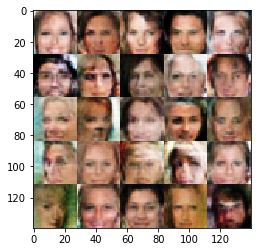

Epoch 1/1... Discriminator Loss: 0.0918... Generator Loss: 5.6158
Epoch 1/1... Discriminator Loss: 0.1566... Generator Loss: 2.9389
Epoch 1/1... Discriminator Loss: 0.0536... Generator Loss: 6.0512
Epoch 1/1... Discriminator Loss: 0.2178... Generator Loss: 5.8397
Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 0.4171... Generator Loss: 2.1400
Epoch 1/1... Discriminator Loss: 0.5613... Generator Loss: 7.4803
Epoch 1/1... Discriminator Loss: 0.0436... Generator Loss: 4.6460
Epoch 1/1... Discriminator Loss: 0.1115... Generator Loss: 2.7046
Epoch 1/1... Discriminator Loss: 3.1435... Generator Loss: 0.1796


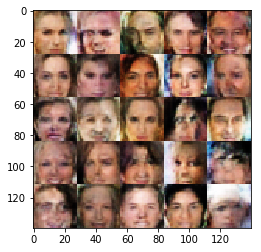

Epoch 1/1... Discriminator Loss: 0.3984... Generator Loss: 1.7706
Epoch 1/1... Discriminator Loss: 0.4312... Generator Loss: 2.4646
Epoch 1/1... Discriminator Loss: 0.0507... Generator Loss: 6.5478
Epoch 1/1... Discriminator Loss: 1.4648... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 0.3691... Generator Loss: 2.0461
Epoch 1/1... Discriminator Loss: 0.0274... Generator Loss: 5.1103
Epoch 1/1... Discriminator Loss: 0.1906... Generator Loss: 2.3183
Epoch 1/1... Discriminator Loss: 1.6283... Generator Loss: 7.8908
Epoch 1/1... Discriminator Loss: 1.1439... Generator Loss: 4.2612
Epoch 1/1... Discriminator Loss: 0.1836... Generator Loss: 3.1532


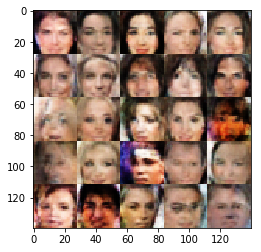

Epoch 1/1... Discriminator Loss: 0.2599... Generator Loss: 2.0817
Epoch 1/1... Discriminator Loss: 0.0393... Generator Loss: 5.2892
Epoch 1/1... Discriminator Loss: 0.0541... Generator Loss: 3.9797
Epoch 1/1... Discriminator Loss: 0.1580... Generator Loss: 2.6892
Epoch 1/1... Discriminator Loss: 0.1214... Generator Loss: 3.0719
Epoch 1/1... Discriminator Loss: 0.1006... Generator Loss: 4.1256
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 1.1131
Epoch 1/1... Discriminator Loss: 1.1207... Generator Loss: 0.6734
Epoch 1/1... Discriminator Loss: 0.0477... Generator Loss: 3.7611
Epoch 1/1... Discriminator Loss: 0.3245... Generator Loss: 1.9057


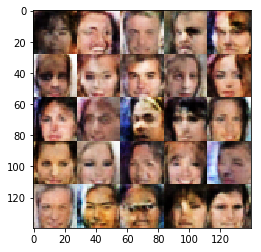

Epoch 1/1... Discriminator Loss: 0.0474... Generator Loss: 5.6177
Epoch 1/1... Discriminator Loss: 0.0782... Generator Loss: 3.3352
Epoch 1/1... Discriminator Loss: 3.0982... Generator Loss: 0.1114
Epoch 1/1... Discriminator Loss: 0.2958... Generator Loss: 2.8710
Epoch 1/1... Discriminator Loss: 0.0338... Generator Loss: 4.8502
Epoch 1/1... Discriminator Loss: 0.2673... Generator Loss: 2.2228
Epoch 1/1... Discriminator Loss: 0.0320... Generator Loss: 5.4013
Epoch 1/1... Discriminator Loss: 1.2573... Generator Loss: 7.6129
Epoch 1/1... Discriminator Loss: 0.2167... Generator Loss: 2.2321
Epoch 1/1... Discriminator Loss: 0.4570... Generator Loss: 2.1265


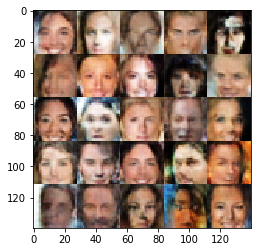

Epoch 1/1... Discriminator Loss: 1.1052... Generator Loss: 0.9998
Epoch 1/1... Discriminator Loss: 0.3257... Generator Loss: 2.3341
Epoch 1/1... Discriminator Loss: 1.6931... Generator Loss: 0.4082
Epoch 1/1... Discriminator Loss: 0.1784... Generator Loss: 4.4683
Epoch 1/1... Discriminator Loss: 0.1158... Generator Loss: 3.4584
Epoch 1/1... Discriminator Loss: 0.3359... Generator Loss: 1.6338
Epoch 1/1... Discriminator Loss: 0.2445... Generator Loss: 2.1132
Epoch 1/1... Discriminator Loss: 0.1065... Generator Loss: 5.3519
Epoch 1/1... Discriminator Loss: 0.0454... Generator Loss: 3.9530
Epoch 1/1... Discriminator Loss: 0.0949... Generator Loss: 3.0949


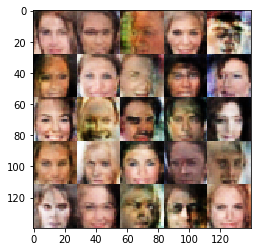

Epoch 1/1... Discriminator Loss: 0.2866... Generator Loss: 5.9789
Epoch 1/1... Discriminator Loss: 1.7912... Generator Loss: 5.6686
Epoch 1/1... Discriminator Loss: 0.1252... Generator Loss: 4.8554
Epoch 1/1... Discriminator Loss: 0.5646... Generator Loss: 1.7327
Epoch 1/1... Discriminator Loss: 0.2062... Generator Loss: 1.9225
Epoch 1/1... Discriminator Loss: 0.6290... Generator Loss: 1.1412
Epoch 1/1... Discriminator Loss: 0.6023... Generator Loss: 1.3888
Epoch 1/1... Discriminator Loss: 0.0828... Generator Loss: 4.3638
Epoch 1/1... Discriminator Loss: 1.9490... Generator Loss: 0.3103
Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 4.7812


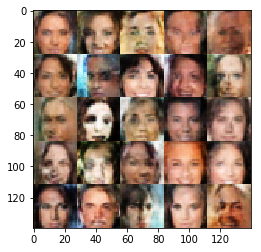

Epoch 1/1... Discriminator Loss: 0.0864... Generator Loss: 8.0907
Epoch 1/1... Discriminator Loss: 0.1193... Generator Loss: 3.7389
Epoch 1/1... Discriminator Loss: 0.0463... Generator Loss: 3.9350
Epoch 1/1... Discriminator Loss: 0.0816... Generator Loss: 5.6076
Epoch 1/1... Discriminator Loss: 0.0973... Generator Loss: 6.9376
Epoch 1/1... Discriminator Loss: 0.1483... Generator Loss: 2.6226
Epoch 1/1... Discriminator Loss: 0.7869... Generator Loss: 1.2832
Epoch 1/1... Discriminator Loss: 3.1129... Generator Loss: 0.1007
Epoch 1/1... Discriminator Loss: 0.5121... Generator Loss: 2.2849
Epoch 1/1... Discriminator Loss: 0.0761... Generator Loss: 4.1440


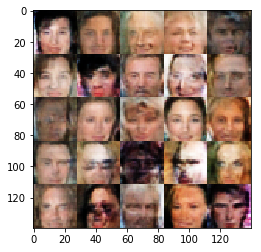

Epoch 1/1... Discriminator Loss: 0.0471... Generator Loss: 4.0297
Epoch 1/1... Discriminator Loss: 0.8165... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 1.6212... Generator Loss: 0.3943
Epoch 1/1... Discriminator Loss: 0.4606... Generator Loss: 1.6575
Epoch 1/1... Discriminator Loss: 0.4478... Generator Loss: 1.4039
Epoch 1/1... Discriminator Loss: 0.2333... Generator Loss: 2.1829
Epoch 1/1... Discriminator Loss: 0.6133... Generator Loss: 1.8449
Epoch 1/1... Discriminator Loss: 0.0708... Generator Loss: 4.1836
Epoch 1/1... Discriminator Loss: 0.2632... Generator Loss: 1.9522
Epoch 1/1... Discriminator Loss: 0.0286... Generator Loss: 5.0761


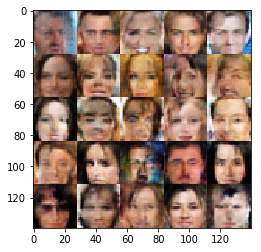

Epoch 1/1... Discriminator Loss: 0.0464... Generator Loss: 4.3379
Epoch 1/1... Discriminator Loss: 0.0580... Generator Loss: 4.3432
Epoch 1/1... Discriminator Loss: 0.1103... Generator Loss: 6.7404
Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 6.9092
Epoch 1/1... Discriminator Loss: 0.8885... Generator Loss: 0.9276
Epoch 1/1... Discriminator Loss: 3.8390... Generator Loss: 0.0517
Epoch 1/1... Discriminator Loss: 0.1151... Generator Loss: 3.2519
Epoch 1/1... Discriminator Loss: 0.1717... Generator Loss: 2.9527
Epoch 1/1... Discriminator Loss: 1.6706... Generator Loss: 0.3551
Epoch 1/1... Discriminator Loss: 0.7187... Generator Loss: 0.9064


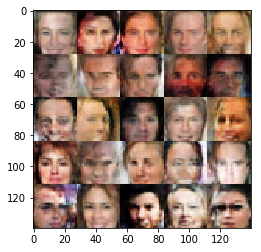

Epoch 1/1... Discriminator Loss: 0.5735... Generator Loss: 1.2783
Epoch 1/1... Discriminator Loss: 0.7751... Generator Loss: 1.0119
Epoch 1/1... Discriminator Loss: 0.2129... Generator Loss: 2.9121
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 1.0859
Epoch 1/1... Discriminator Loss: 0.0621... Generator Loss: 3.9607
Epoch 1/1... Discriminator Loss: 0.5233... Generator Loss: 8.6391
Epoch 1/1... Discriminator Loss: 0.1707... Generator Loss: 2.8057
Epoch 1/1... Discriminator Loss: 0.1720... Generator Loss: 3.3347
Epoch 1/1... Discriminator Loss: 0.1817... Generator Loss: 4.7398
Epoch 1/1... Discriminator Loss: 0.2136... Generator Loss: 2.0515


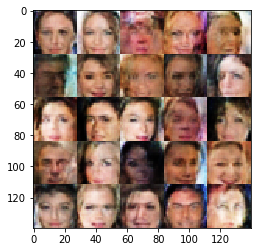

Epoch 1/1... Discriminator Loss: 0.4031... Generator Loss: 1.4646
Epoch 1/1... Discriminator Loss: 3.3203... Generator Loss: 0.0961
Epoch 1/1... Discriminator Loss: 1.7697... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 0.2320... Generator Loss: 3.2937
Epoch 1/1... Discriminator Loss: 0.2989... Generator Loss: 2.1782
Epoch 1/1... Discriminator Loss: 0.5744... Generator Loss: 1.2884
Epoch 1/1... Discriminator Loss: 0.5833... Generator Loss: 7.3748
Epoch 1/1... Discriminator Loss: 0.0408... Generator Loss: 4.4263
Epoch 1/1... Discriminator Loss: 0.0631... Generator Loss: 4.7774
Epoch 1/1... Discriminator Loss: 0.2995... Generator Loss: 2.3746


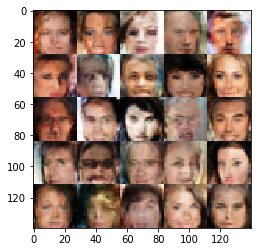

Epoch 1/1... Discriminator Loss: 0.5806... Generator Loss: 1.4054
Epoch 1/1... Discriminator Loss: 0.0298... Generator Loss: 6.6987
Epoch 1/1... Discriminator Loss: 0.4621... Generator Loss: 1.6136
Epoch 1/1... Discriminator Loss: 0.0139... Generator Loss: 7.2226
Epoch 1/1... Discriminator Loss: 0.2961... Generator Loss: 2.3118
Epoch 1/1... Discriminator Loss: 0.0726... Generator Loss: 3.7235
Epoch 1/1... Discriminator Loss: 0.4082... Generator Loss: 6.0803
Epoch 1/1... Discriminator Loss: 0.5253... Generator Loss: 1.6253
Epoch 1/1... Discriminator Loss: 0.0937... Generator Loss: 5.7937
Epoch 1/1... Discriminator Loss: 0.1098... Generator Loss: 4.6511


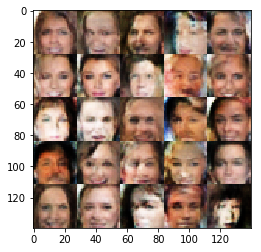

Epoch 1/1... Discriminator Loss: 0.1334... Generator Loss: 3.6094
Epoch 1/1... Discriminator Loss: 0.0815... Generator Loss: 4.5956
Epoch 1/1... Discriminator Loss: 0.4996... Generator Loss: 2.0789
Epoch 1/1... Discriminator Loss: 0.0177... Generator Loss: 6.7914
Epoch 1/1... Discriminator Loss: 0.1691... Generator Loss: 3.0957
Epoch 1/1... Discriminator Loss: 0.3575... Generator Loss: 2.2845
Epoch 1/1... Discriminator Loss: 0.1185... Generator Loss: 5.3714
Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 0.1258... Generator Loss: 3.4598
Epoch 1/1... Discriminator Loss: 0.4966... Generator Loss: 5.8020


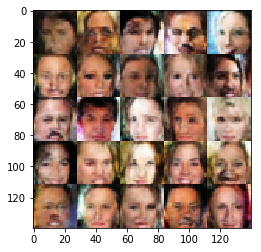

Epoch 1/1... Discriminator Loss: 0.0728... Generator Loss: 3.8969
Epoch 1/1... Discriminator Loss: 0.1537... Generator Loss: 2.8142
Epoch 1/1... Discriminator Loss: 0.2321... Generator Loss: 2.3493
Epoch 1/1... Discriminator Loss: 0.0460... Generator Loss: 4.1730
Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 4.0337
Epoch 1/1... Discriminator Loss: 0.0353... Generator Loss: 4.7664
Epoch 1/1... Discriminator Loss: 0.1292... Generator Loss: 3.2246
Epoch 1/1... Discriminator Loss: 0.0393... Generator Loss: 4.9361
Epoch 1/1... Discriminator Loss: 0.4752... Generator Loss: 8.2427
Epoch 1/1... Discriminator Loss: 1.7710... Generator Loss: 0.4007


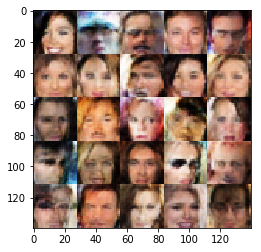

Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 0.1706... Generator Loss: 5.4176
Epoch 1/1... Discriminator Loss: 0.0158... Generator Loss: 7.6019
Epoch 1/1... Discriminator Loss: 1.8056... Generator Loss: 0.3250
Epoch 1/1... Discriminator Loss: 0.5928... Generator Loss: 1.7447
Epoch 1/1... Discriminator Loss: 0.0431... Generator Loss: 4.6714
Epoch 1/1... Discriminator Loss: 0.4329... Generator Loss: 4.9304
Epoch 1/1... Discriminator Loss: 0.1978... Generator Loss: 2.8781
Epoch 1/1... Discriminator Loss: 0.3074... Generator Loss: 2.3406
Epoch 1/1... Discriminator Loss: 0.0834... Generator Loss: 3.7322


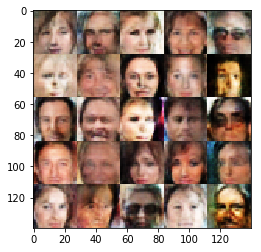

Epoch 1/1... Discriminator Loss: 0.0605... Generator Loss: 3.5790
Epoch 1/1... Discriminator Loss: 1.7600... Generator Loss: 0.4409
Epoch 1/1... Discriminator Loss: 0.1881... Generator Loss: 4.3176
Epoch 1/1... Discriminator Loss: 0.0419... Generator Loss: 5.1830
Epoch 1/1... Discriminator Loss: 0.1655... Generator Loss: 2.8141
Epoch 1/1... Discriminator Loss: 0.1733... Generator Loss: 5.6251
Epoch 1/1... Discriminator Loss: 0.6111... Generator Loss: 1.2785
Epoch 1/1... Discriminator Loss: 0.1610... Generator Loss: 2.9723
Epoch 1/1... Discriminator Loss: 0.0320... Generator Loss: 5.8036
Epoch 1/1... Discriminator Loss: 0.0733... Generator Loss: 4.4748


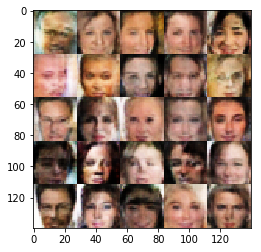

Epoch 1/1... Discriminator Loss: 0.1123... Generator Loss: 3.6325
Epoch 1/1... Discriminator Loss: 0.1336... Generator Loss: 2.7500
Epoch 1/1... Discriminator Loss: 0.1608... Generator Loss: 4.6181
Epoch 1/1... Discriminator Loss: 0.0516... Generator Loss: 4.3834
Epoch 1/1... Discriminator Loss: 0.0461... Generator Loss: 5.2059
Epoch 1/1... Discriminator Loss: 0.0225... Generator Loss: 5.2769
Epoch 1/1... Discriminator Loss: 0.0271... Generator Loss: 5.1555
Epoch 1/1... Discriminator Loss: 1.7808... Generator Loss: 6.0584
Epoch 1/1... Discriminator Loss: 0.3200... Generator Loss: 3.1875
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.5673


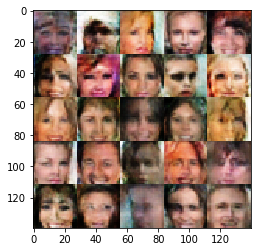

Epoch 1/1... Discriminator Loss: 0.0317... Generator Loss: 6.5426
Epoch 1/1... Discriminator Loss: 0.6950... Generator Loss: 1.1105
Epoch 1/1... Discriminator Loss: 0.3851... Generator Loss: 1.4556
Epoch 1/1... Discriminator Loss: 0.0547... Generator Loss: 5.0933
Epoch 1/1... Discriminator Loss: 0.1280... Generator Loss: 2.9372
Epoch 1/1... Discriminator Loss: 2.4576... Generator Loss: 0.1742
Epoch 1/1... Discriminator Loss: 0.2636... Generator Loss: 8.9934
Epoch 1/1... Discriminator Loss: 0.0805... Generator Loss: 4.3679
Epoch 1/1... Discriminator Loss: 2.6748... Generator Loss: 10.3972
Epoch 1/1... Discriminator Loss: 0.3710... Generator Loss: 1.9823


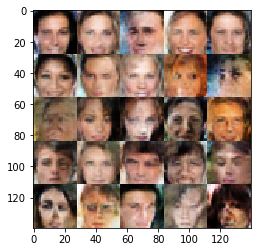

Epoch 1/1... Discriminator Loss: 0.7072... Generator Loss: 9.7482
Epoch 1/1... Discriminator Loss: 0.0306... Generator Loss: 6.3880
Epoch 1/1... Discriminator Loss: 0.7778... Generator Loss: 1.0216
Epoch 1/1... Discriminator Loss: 0.8056... Generator Loss: 1.5337
Epoch 1/1... Discriminator Loss: 0.0484... Generator Loss: 4.2982
Epoch 1/1... Discriminator Loss: 0.3824... Generator Loss: 6.2051
Epoch 1/1... Discriminator Loss: 0.2052... Generator Loss: 2.1312
Epoch 1/1... Discriminator Loss: 2.3328... Generator Loss: 0.3237
Epoch 1/1... Discriminator Loss: 0.8730... Generator Loss: 0.9605
Epoch 1/1... Discriminator Loss: 3.6343... Generator Loss: 0.0472


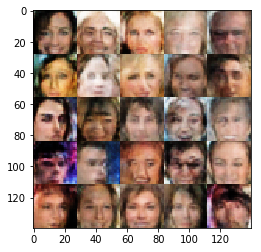

Epoch 1/1... Discriminator Loss: 0.1125... Generator Loss: 4.5720
Epoch 1/1... Discriminator Loss: 1.9764... Generator Loss: 9.2680
Epoch 1/1... Discriminator Loss: 0.0936... Generator Loss: 4.7938
Epoch 1/1... Discriminator Loss: 0.0644... Generator Loss: 4.4514
Epoch 1/1... Discriminator Loss: 0.2369... Generator Loss: 2.3098
Epoch 1/1... Discriminator Loss: 0.2086... Generator Loss: 2.1477
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 0.0683... Generator Loss: 3.8216
Epoch 1/1... Discriminator Loss: 0.8085... Generator Loss: 1.3865


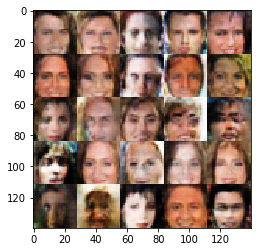

Epoch 1/1... Discriminator Loss: 0.4097... Generator Loss: 2.0604
Epoch 1/1... Discriminator Loss: 0.3674... Generator Loss: 5.8474
Epoch 1/1... Discriminator Loss: 0.0852... Generator Loss: 3.3817
Epoch 1/1... Discriminator Loss: 0.2037... Generator Loss: 3.0985
Epoch 1/1... Discriminator Loss: 0.0919... Generator Loss: 3.2998
Epoch 1/1... Discriminator Loss: 0.4002... Generator Loss: 2.3782
Epoch 1/1... Discriminator Loss: 0.1099... Generator Loss: 2.8630
Epoch 1/1... Discriminator Loss: 0.5249... Generator Loss: 1.4582
Epoch 1/1... Discriminator Loss: 0.0586... Generator Loss: 4.1960
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 10.1383


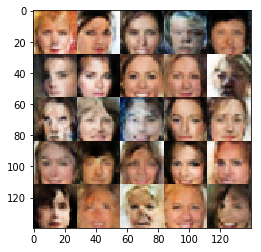

Epoch 1/1... Discriminator Loss: 0.4025... Generator Loss: 1.7905
Epoch 1/1... Discriminator Loss: 0.4321... Generator Loss: 1.9073
Epoch 1/1... Discriminator Loss: 2.4835... Generator Loss: 0.2485
Epoch 1/1... Discriminator Loss: 0.0635... Generator Loss: 3.4205
Epoch 1/1... Discriminator Loss: 1.6429... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 0.1772... Generator Loss: 2.4749
Epoch 1/1... Discriminator Loss: 0.2224... Generator Loss: 2.3468
Epoch 1/1... Discriminator Loss: 0.2166... Generator Loss: 2.7981
Epoch 1/1... Discriminator Loss: 0.2614... Generator Loss: 2.8317
Epoch 1/1... Discriminator Loss: 1.4569... Generator Loss: 0.4292


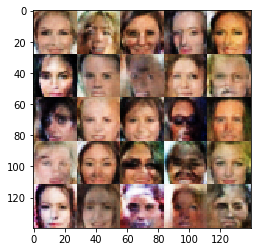

Epoch 1/1... Discriminator Loss: 0.0296... Generator Loss: 4.7350
Epoch 1/1... Discriminator Loss: 0.5313... Generator Loss: 1.4445
Epoch 1/1... Discriminator Loss: 0.0271... Generator Loss: 9.5660
Epoch 1/1... Discriminator Loss: 0.1507... Generator Loss: 4.6756
Epoch 1/1... Discriminator Loss: 0.0742... Generator Loss: 3.3283
Epoch 1/1... Discriminator Loss: 0.0499... Generator Loss: 5.8382
Epoch 1/1... Discriminator Loss: 0.0269... Generator Loss: 5.4370
Epoch 1/1... Discriminator Loss: 0.1305... Generator Loss: 4.4673
Epoch 1/1... Discriminator Loss: 0.2601... Generator Loss: 3.4467
Epoch 1/1... Discriminator Loss: 0.0902... Generator Loss: 3.4650


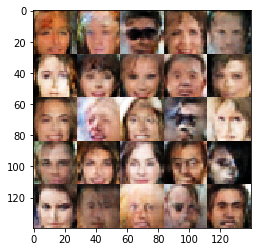

Epoch 1/1... Discriminator Loss: 0.1837... Generator Loss: 3.0722
Epoch 1/1... Discriminator Loss: 0.1000... Generator Loss: 3.3969
Epoch 1/1... Discriminator Loss: 0.0150... Generator Loss: 6.1912
Epoch 1/1... Discriminator Loss: 0.0176... Generator Loss: 4.9449
Epoch 1/1... Discriminator Loss: 0.0729... Generator Loss: 3.4941
Epoch 1/1... Discriminator Loss: 0.0181... Generator Loss: 6.0199
Epoch 1/1... Discriminator Loss: 0.0315... Generator Loss: 4.1278
Epoch 1/1... Discriminator Loss: 0.0111... Generator Loss: 5.4197
Epoch 1/1... Discriminator Loss: 0.1506... Generator Loss: 4.6937
Epoch 1/1... Discriminator Loss: 0.1455... Generator Loss: 9.5352


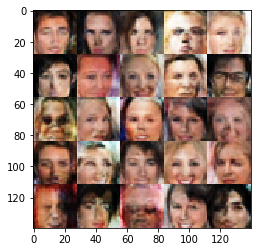

Epoch 1/1... Discriminator Loss: 4.1422... Generator Loss: 0.1462
Epoch 1/1... Discriminator Loss: 1.6125... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 0.0858... Generator Loss: 3.7837
Epoch 1/1... Discriminator Loss: 0.1592... Generator Loss: 3.2079
Epoch 1/1... Discriminator Loss: 0.2836... Generator Loss: 2.9270
Epoch 1/1... Discriminator Loss: 2.6837... Generator Loss: 0.1402
Epoch 1/1... Discriminator Loss: 0.0944... Generator Loss: 3.1659
Epoch 1/1... Discriminator Loss: 0.1851... Generator Loss: 2.7390
Epoch 1/1... Discriminator Loss: 0.5958... Generator Loss: 1.5051
Epoch 1/1... Discriminator Loss: 0.0850... Generator Loss: 3.8689


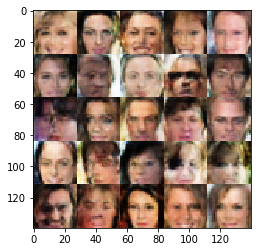

Epoch 1/1... Discriminator Loss: 0.0620... Generator Loss: 3.8183
Epoch 1/1... Discriminator Loss: 0.5310... Generator Loss: 1.4027
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 1.1261
Epoch 1/1... Discriminator Loss: 0.1309... Generator Loss: 3.9717
Epoch 1/1... Discriminator Loss: 0.1738... Generator Loss: 2.4175
Epoch 1/1... Discriminator Loss: 0.4826... Generator Loss: 1.5369
Epoch 1/1... Discriminator Loss: 0.4145... Generator Loss: 2.1260
Epoch 1/1... Discriminator Loss: 0.1298... Generator Loss: 2.6723
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 13.0252
Epoch 1/1... Discriminator Loss: 0.3689... Generator Loss: 1.8275


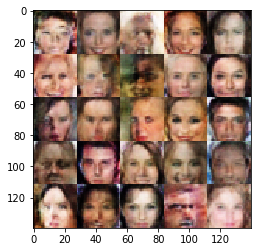

Epoch 1/1... Discriminator Loss: 0.0328... Generator Loss: 4.9690
Epoch 1/1... Discriminator Loss: 0.0539... Generator Loss: 3.9901
Epoch 1/1... Discriminator Loss: 0.3962... Generator Loss: 1.6518
Epoch 1/1... Discriminator Loss: 0.5574... Generator Loss: 7.7907
Epoch 1/1... Discriminator Loss: 0.0424... Generator Loss: 4.3206
Epoch 1/1... Discriminator Loss: 0.1899... Generator Loss: 5.7774
Epoch 1/1... Discriminator Loss: 0.0168... Generator Loss: 5.6676
Epoch 1/1... Discriminator Loss: 0.0543... Generator Loss: 4.8900
Epoch 1/1... Discriminator Loss: 0.7340... Generator Loss: 1.0618
Epoch 1/1... Discriminator Loss: 0.1173... Generator Loss: 3.1543


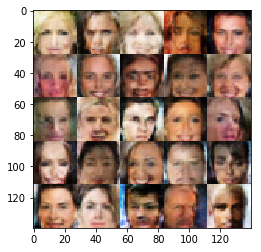

Epoch 1/1... Discriminator Loss: 0.2857... Generator Loss: 1.9893
Epoch 1/1... Discriminator Loss: 2.2377... Generator Loss: 0.3842
Epoch 1/1... Discriminator Loss: 0.2752... Generator Loss: 2.4464
Epoch 1/1... Discriminator Loss: 2.4875... Generator Loss: 0.1626
Epoch 1/1... Discriminator Loss: 0.6949... Generator Loss: 1.3956
Epoch 1/1... Discriminator Loss: 0.0409... Generator Loss: 5.4627
Epoch 1/1... Discriminator Loss: 0.3483... Generator Loss: 2.7696
Epoch 1/1... Discriminator Loss: 0.6159... Generator Loss: 1.7356
Epoch 1/1... Discriminator Loss: 0.1589... Generator Loss: 2.5654
Epoch 1/1... Discriminator Loss: 0.9905... Generator Loss: 1.1068


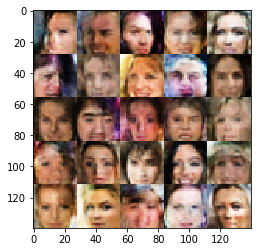

Epoch 1/1... Discriminator Loss: 0.0408... Generator Loss: 4.2400
Epoch 1/1... Discriminator Loss: 0.0256... Generator Loss: 5.5825
Epoch 1/1... Discriminator Loss: 0.0943... Generator Loss: 8.8902
Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 1.6171
Epoch 1/1... Discriminator Loss: 0.0425... Generator Loss: 4.8066
Epoch 1/1... Discriminator Loss: 0.3171... Generator Loss: 2.6707
Epoch 1/1... Discriminator Loss: 0.0366... Generator Loss: 5.1134
Epoch 1/1... Discriminator Loss: 0.1235... Generator Loss: 3.3105
Epoch 1/1... Discriminator Loss: 0.3699... Generator Loss: 1.7736
Epoch 1/1... Discriminator Loss: 3.4524... Generator Loss: 0.0965


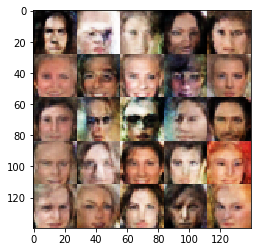

Epoch 1/1... Discriminator Loss: 0.0265... Generator Loss: 5.5172
Epoch 1/1... Discriminator Loss: 0.0087... Generator Loss: 6.4268
Epoch 1/1... Discriminator Loss: 0.1347... Generator Loss: 3.0244
Epoch 1/1... Discriminator Loss: 0.1159... Generator Loss: 3.3276
Epoch 1/1... Discriminator Loss: 0.2555... Generator Loss: 2.6348
Epoch 1/1... Discriminator Loss: 4.4181... Generator Loss: 0.0411
Epoch 1/1... Discriminator Loss: 0.0763... Generator Loss: 4.4654
Epoch 1/1... Discriminator Loss: 0.2926... Generator Loss: 2.6554
Epoch 1/1... Discriminator Loss: 0.2544... Generator Loss: 4.6926
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 1.0591


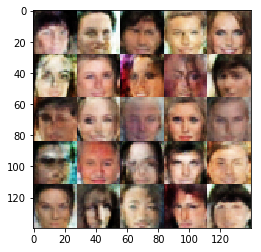

Epoch 1/1... Discriminator Loss: 0.3764... Generator Loss: 2.1818
Epoch 1/1... Discriminator Loss: 0.0134... Generator Loss: 8.7232
Epoch 1/1... Discriminator Loss: 0.2852... Generator Loss: 1.7647
Epoch 1/1... Discriminator Loss: 0.7345... Generator Loss: 1.1325
Epoch 1/1... Discriminator Loss: 0.4060... Generator Loss: 1.7016
Epoch 1/1... Discriminator Loss: 0.4960... Generator Loss: 8.0082
Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 6.9030
Epoch 1/1... Discriminator Loss: 0.0052... Generator Loss: 6.9397
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 0.0561... Generator Loss: 3.8050


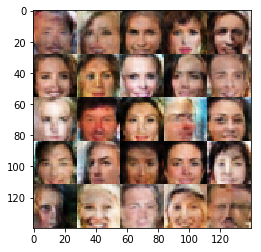

Epoch 1/1... Discriminator Loss: 2.5226... Generator Loss: 7.7146
Epoch 1/1... Discriminator Loss: 0.6095... Generator Loss: 2.7351
Epoch 1/1... Discriminator Loss: 0.0763... Generator Loss: 4.0068
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 7.1163
Epoch 1/1... Discriminator Loss: 0.0675... Generator Loss: 4.5835
Epoch 1/1... Discriminator Loss: 0.1136... Generator Loss: 3.5567
Epoch 1/1... Discriminator Loss: 0.0160... Generator Loss: 8.1345
Epoch 1/1... Discriminator Loss: 0.0260... Generator Loss: 4.5108
Epoch 1/1... Discriminator Loss: 3.8906... Generator Loss: 0.0593
Epoch 1/1... Discriminator Loss: 0.0397... Generator Loss: 6.4483


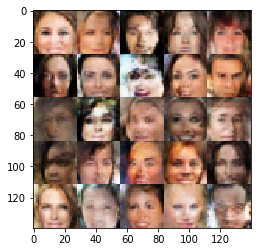

Epoch 1/1... Discriminator Loss: 0.0095... Generator Loss: 7.0499
Epoch 1/1... Discriminator Loss: 0.1288... Generator Loss: 3.5101
Epoch 1/1... Discriminator Loss: 0.5970... Generator Loss: 1.6405
Epoch 1/1... Discriminator Loss: 0.7130... Generator Loss: 1.3757
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 7.8960
Epoch 1/1... Discriminator Loss: 0.2004... Generator Loss: 2.7954
Epoch 1/1... Discriminator Loss: 0.4734... Generator Loss: 2.6210
Epoch 1/1... Discriminator Loss: 0.0460... Generator Loss: 4.9812
Epoch 1/1... Discriminator Loss: 0.2032... Generator Loss: 3.1685
Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.6958


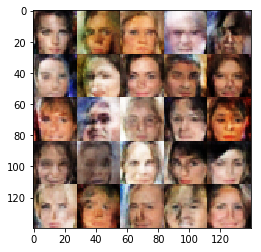

Epoch 1/1... Discriminator Loss: 0.1989... Generator Loss: 2.6463
Epoch 1/1... Discriminator Loss: 0.6326... Generator Loss: 1.4939
Epoch 1/1... Discriminator Loss: 0.1595... Generator Loss: 2.5401
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 8.1363
Epoch 1/1... Discriminator Loss: 0.1902... Generator Loss: 3.3801
Epoch 1/1... Discriminator Loss: 0.0213... Generator Loss: 6.4418
Epoch 1/1... Discriminator Loss: 0.5515... Generator Loss: 1.5631
Epoch 1/1... Discriminator Loss: 0.0220... Generator Loss: 6.1268
Epoch 1/1... Discriminator Loss: 0.4331... Generator Loss: 2.0134
Epoch 1/1... Discriminator Loss: 0.0126... Generator Loss: 5.6925


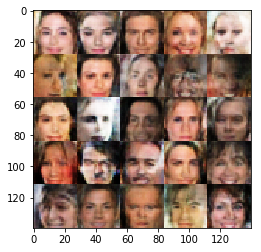

Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 8.1679
Epoch 1/1... Discriminator Loss: 0.0752... Generator Loss: 4.2148
Epoch 1/1... Discriminator Loss: 1.7804... Generator Loss: 0.4978
Epoch 1/1... Discriminator Loss: 0.0224... Generator Loss: 5.7659
Epoch 1/1... Discriminator Loss: 0.4920... Generator Loss: 1.4701
Epoch 1/1... Discriminator Loss: 0.0110... Generator Loss: 7.7208
Epoch 1/1... Discriminator Loss: 0.1428... Generator Loss: 3.7189
Epoch 1/1... Discriminator Loss: 0.0686... Generator Loss: 4.3386
Epoch 1/1... Discriminator Loss: 0.0117... Generator Loss: 6.6282
Epoch 1/1... Discriminator Loss: 0.1831... Generator Loss: 2.5119


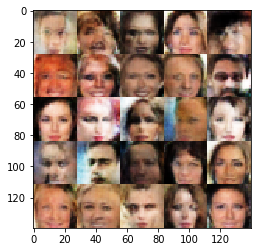

Epoch 1/1... Discriminator Loss: 0.1004... Generator Loss: 2.8368
Epoch 1/1... Discriminator Loss: 0.0731... Generator Loss: 3.3172
Epoch 1/1... Discriminator Loss: 0.0693... Generator Loss: 4.0895
Epoch 1/1... Discriminator Loss: 0.0285... Generator Loss: 4.6796
Epoch 1/1... Discriminator Loss: 0.9446... Generator Loss: 0.8765
Epoch 1/1... Discriminator Loss: 0.1847... Generator Loss: 2.5826
Epoch 1/1... Discriminator Loss: 0.0158... Generator Loss: 5.5151
Epoch 1/1... Discriminator Loss: 0.1688... Generator Loss: 2.6882
Epoch 1/1... Discriminator Loss: 0.1228... Generator Loss: 3.1722
Epoch 1/1... Discriminator Loss: 0.0865... Generator Loss: 6.3135


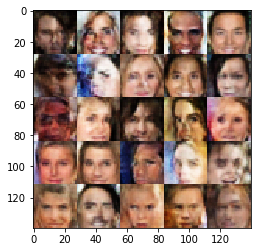

Epoch 1/1... Discriminator Loss: 0.0746... Generator Loss: 3.6817
Epoch 1/1... Discriminator Loss: 0.0867... Generator Loss: 4.9067
Epoch 1/1... Discriminator Loss: 0.3229... Generator Loss: 2.0085
Epoch 1/1... Discriminator Loss: 0.0912... Generator Loss: 3.6314
Epoch 1/1... Discriminator Loss: 0.2706... Generator Loss: 2.0696
Epoch 1/1... Discriminator Loss: 0.0164... Generator Loss: 7.3303
Epoch 1/1... Discriminator Loss: 0.0383... Generator Loss: 4.3133
Epoch 1/1... Discriminator Loss: 0.3465... Generator Loss: 8.8453
Epoch 1/1... Discriminator Loss: 3.9475... Generator Loss: 0.3033
Epoch 1/1... Discriminator Loss: 0.1814... Generator Loss: 4.4042


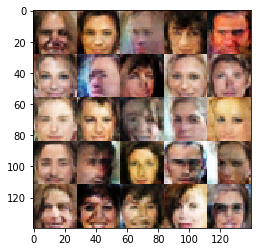

Epoch 1/1... Discriminator Loss: 0.8201... Generator Loss: 1.0756
Epoch 1/1... Discriminator Loss: 0.2148... Generator Loss: 2.7421
Epoch 1/1... Discriminator Loss: 0.2975... Generator Loss: 2.1553
Epoch 1/1... Discriminator Loss: 0.1668... Generator Loss: 2.8323
Epoch 1/1... Discriminator Loss: 0.7440... Generator Loss: 1.0847
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 5.8527
Epoch 1/1... Discriminator Loss: 0.2940... Generator Loss: 1.9775
Epoch 1/1... Discriminator Loss: 0.0277... Generator Loss: 5.9106
Epoch 1/1... Discriminator Loss: 0.1930... Generator Loss: 2.6169
Epoch 1/1... Discriminator Loss: 0.0052... Generator Loss: 6.9719


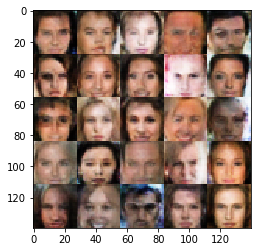

Epoch 1/1... Discriminator Loss: 1.0825... Generator Loss: 3.8770
Epoch 1/1... Discriminator Loss: 0.1689... Generator Loss: 2.8050
Epoch 1/1... Discriminator Loss: 0.0426... Generator Loss: 5.3143
Epoch 1/1... Discriminator Loss: 0.0535... Generator Loss: 5.6776
Epoch 1/1... Discriminator Loss: 0.1335... Generator Loss: 3.1722
Epoch 1/1... Discriminator Loss: 2.0819... Generator Loss: 0.2464
Epoch 1/1... Discriminator Loss: 0.4888... Generator Loss: 2.3115
Epoch 1/1... Discriminator Loss: 0.3108... Generator Loss: 2.1685
Epoch 1/1... Discriminator Loss: 0.0957... Generator Loss: 3.8309
Epoch 1/1... Discriminator Loss: 0.1105... Generator Loss: 3.8071


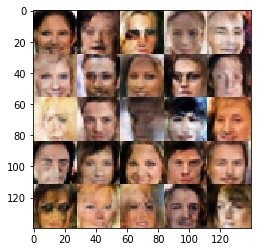

Epoch 1/1... Discriminator Loss: 0.0676... Generator Loss: 4.0740
Epoch 1/1... Discriminator Loss: 0.0316... Generator Loss: 5.3239
Epoch 1/1... Discriminator Loss: 0.7940... Generator Loss: 0.8547
Epoch 1/1... Discriminator Loss: 0.0463... Generator Loss: 3.8585
Epoch 1/1... Discriminator Loss: 2.8792... Generator Loss: 0.1656
Epoch 1/1... Discriminator Loss: 1.0105... Generator Loss: 0.9655
Epoch 1/1... Discriminator Loss: 0.1567... Generator Loss: 3.4744
Epoch 1/1... Discriminator Loss: 0.1262... Generator Loss: 7.8572
Epoch 1/1... Discriminator Loss: 1.8827... Generator Loss: 0.3120
Epoch 1/1... Discriminator Loss: 0.0514... Generator Loss: 5.2796


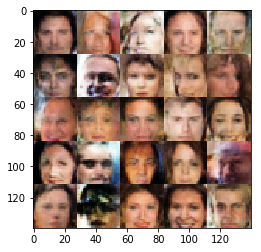

Epoch 1/1... Discriminator Loss: 0.8929... Generator Loss: 1.1903
Epoch 1/1... Discriminator Loss: 0.4332... Generator Loss: 1.5958
Epoch 1/1... Discriminator Loss: 0.0292... Generator Loss: 5.6597
Epoch 1/1... Discriminator Loss: 0.5989... Generator Loss: 1.4665
Epoch 1/1... Discriminator Loss: 0.0323... Generator Loss: 4.1412
Epoch 1/1... Discriminator Loss: 0.8573... Generator Loss: 1.0456
Epoch 1/1... Discriminator Loss: 1.1361... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 0.5486... Generator Loss: 1.3524
Epoch 1/1... Discriminator Loss: 0.2343... Generator Loss: 2.8693
Epoch 1/1... Discriminator Loss: 0.1864... Generator Loss: 2.5537


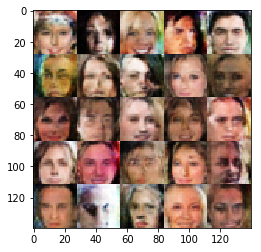

Epoch 1/1... Discriminator Loss: 0.0260... Generator Loss: 4.8219
Epoch 1/1... Discriminator Loss: 0.1434... Generator Loss: 4.4919
Epoch 1/1... Discriminator Loss: 0.3813... Generator Loss: 2.7281
Epoch 1/1... Discriminator Loss: 0.3438... Generator Loss: 2.3908
Epoch 1/1... Discriminator Loss: 0.4341... Generator Loss: 2.6883
Epoch 1/1... Discriminator Loss: 0.4414... Generator Loss: 2.0539
Epoch 1/1... Discriminator Loss: 0.4292... Generator Loss: 1.8541
Epoch 1/1... Discriminator Loss: 0.5763... Generator Loss: 1.2755
Epoch 1/1... Discriminator Loss: 0.1525... Generator Loss: 8.6754
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 6.4305


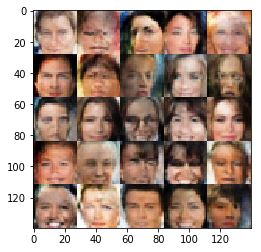

Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 1.1018
Epoch 1/1... Discriminator Loss: 0.0348... Generator Loss: 6.0236


In [14]:
batch_size = 20
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.